# Telecom Churn Study
#### Objective
To reduce customer churn, telecom companies need to predict which customers are at high risk of churn. The business objective is to predict the churn in the last (i.e. the ninth) month using the data (features) from the first three months(6,7 and 8th month).

__Build models to predict churn. The predictive model will serve two purposes:__

1. It will be used to predict whether a high-value customer will churn or not.
2. It will be used to identify important variables that are strong predictors of churn.

#### Evaluation Metric
For the business it is more important to identify churners than the non-churners accurately. For this we will be focusing on following evaluation metric:
 - Sensitivity
 - Specificity
 - AUC_ROC score
 - Overall accuracy
 
#### Handling Class Imbalance
The data is highly imbalance. To handle this we will be using inbuilt 'class_weight' parameter of different classifier algorithm.

In [1]:
# Suppress warnings
import warnings
warnings.filterwarnings('ignore')

# Step 1. Data Understanding, Cleaning and Preparation

In [2]:
# libraries

import numpy as np
import pandas as pd

# For Visualisation
import matplotlib.pyplot as plt
import seaborn as sns

# For Model building
from sklearn.svm import SVC


# For metric evaluation
from sklearn import metrics
from sklearn.metrics import confusion_matrix

# For Cross validation and regularization model building
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

# For scaling
from sklearn.preprocessing import scale

# For Displaying
from IPython.core.display import display

#### Reading data

In [3]:
telecom = pd.read_csv("telecom_churn_data.csv")
telecom.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,...,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58
1,7001865778,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,34.047,...,0,NaN,1.0,1.0,NaN,1006,0.0,0.0,0.00,0.00
2,7001625959,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,167.690,...,0,NaN,NaN,NaN,1.0,1103,0.0,0.0,4.17,0.00
3,7001204172,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,221.338,...,0,NaN,NaN,NaN,NaN,2491,0.0,0.0,0.00,0.00
4,7000142493,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,261.636,...,0,0.0,NaN,NaN,NaN,1526,0.0,0.0,0.00,0.00


### Data Understanding

In [4]:
# Inspecting number of rows and column of dataset
telecom.shape

(99999, 226)

In [5]:
# Inspecting entries, dtypes, number of columns of dataset
telecom.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: float64(179), int64(35), object(12)
memory usage: 172.4+ MB


In [6]:
# Checking overall spread of all the columns of dataset
telecom.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,...,99999.000000,25153.000000,25571.000000,26339.000000,25922.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000
mean,7.001207e+09,109.0,0.0,0.0,0.0,282.987358,278.536648,279.154731,261.645069,132.395875,...,0.084581,0.914404,0.908764,0.890808,0.860968,1219.854749,68.170248,66.839062,60.021204,3.299373
std,6.956694e+05,0.0,0.0,0.0,0.0,328.439770,338.156291,344.474791,341.998630,297.207406,...,0.650457,0.279772,0.287950,0.311885,0.345987,954.733842,267.580450,271.201856,253.938223,32.408353
min,7.000000e+09,109.0,0.0,0.0,0.0,-2258.709000,-2014.045000,-945.808000,-1899.505000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,180.000000,0.000000,0.000000,0.000000,0.000000
25%,7.000606e+09,109.0,0.0,0.0,0.0,93.411500,86.980500,84.126000,62.685000,7.380000,...,0.000000,1.000000,1.000000,1.000000,1.000000,467.000000,0.000000,0.000000,0.000000,0.000000
50%,7.001205e+09,109.0,0.0,0.0,0.0,197.704000,191.640000,192.080000,176.849000,34.310000,...,0.000000,1.000000,1.000000,1.000000,1.000000,863.000000,0.000000,0.000000,0.000000,0.000000
75%,7.001812e+09,109.0,0.0,0.0,0.0,371.060000,365.344500,369.370500,353.466500,118.740000,...,0.000000,1.000000,1.000000,1.000000,1.000000,1807.500000,0.000000,0.000000,0.000000,0.000000
max,7.002411e+09,109.0,0.0,0.0,0.0,27731.088000,35145.834000,33543.624000,38805.617000,7376.710000,...,49.000000,1.000000,1.000000,1.000000,1.000000,4337.000000,12916.220000,9165.600000,11166.210000,2618.570000


In [7]:
# Inspecting column names
telecom.columns.values

array(['mobile_number', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou',
       'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7',
       'last_date_of_month_8', 'last_date_of_month_9', 'arpu_6', 'arpu_7',
       'arpu_8', 'arpu_9', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8',
       'onnet_mou_9', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8',
       'offnet_mou_9', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8',
       'roam_ic_mou_9', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8',
       'roam_og_mou_9', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7',
       'loc_og_t2t_mou_8', 'loc_og_t2t_mou_9', 'loc_og_t2m_mou_6',
       'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2m_mou_9',
       'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8',
       'loc_og_t2f_mou_9', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7',
       'loc_og_t2c_mou_8', 'loc_og_t2c_mou_9', 'loc_og_mou_6',
       'loc_og_mou_7', 'loc_og_mou_8', 'loc_og_mou_9', 'std_og_t2t_mou_6',
       'std_og_t2t

### Data Quality issue Handling

#### Columns of type 'object'

In [8]:
# Getting all object type columns
all_date_col= telecom.select_dtypes(include=[object]).columns
all_date_col

Index(['last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8',
       'last_date_of_month_9', 'date_of_last_rech_6', 'date_of_last_rech_7',
       'date_of_last_rech_8', 'date_of_last_rech_9',
       'date_of_last_rech_data_6', 'date_of_last_rech_data_7',
       'date_of_last_rech_data_8', 'date_of_last_rech_data_9'],
      dtype='object')

All the __date columns are of Object type__. Converting them into __datetime type__

In [9]:
# Converting all date column of object type into datetime type
telecom[all_date_col] = telecom[all_date_col].apply(pd.to_datetime)

In [10]:
telecom.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: datetime64[ns](12), float64(179), int64(35)
memory usage: 172.4 MB


#### Column corresponding to different month

We can observe that the columns contains data for specific months. Renaming the columns as follows:
 - jun_vbc_3g --> vbc_3g_6
 - jul_vbc_3g --> vbc_3g_7
 - aug_vbc_3g --> vbc_3g_8
 - sep_vbc_3g --> vbc_3g_9

In [11]:
telecom.rename(columns={'jun_vbc_3g': 'vbc_3g_6', 
                        'jul_vbc_3g': 'vbc_3g_7',
                        'aug_vbc_3g': 'vbc_3g_8',
                        'sep_vbc_3g': 'vbc_3g_9'}, inplace=True)

### Data Preparation

### <span style="color:blue">Assumption</span>

Although we should treat Null values first, but during this process it is possible that important information(data points) get deleted. So we will treat Null values after calculating High-value customers.

### <span style="color:blue">Filter high-value customers - Problem Statement Requirement</span>

#### <span style="color:red">High value customer</span>
As per the definition High value customer are:
Those who have recharged with an amount more than or equal to X, where X is the 70th percentile of the average recharge amount in the first two months (the good phase).

Recharge can be of two types:
- Topup recharge
- Data recharge

So we need to calculate __average recharge = (topup recharge + data recharge) / 2__

In [12]:
# Imputing Null values with 0 in the columns required to calculate average recharge
data_cols1 = ['av_rech_amt_data_6','av_rech_amt_data_7','av_rech_amt_data_8','av_rech_amt_data_9']
telecom[data_cols1] = telecom[data_cols1].fillna(0)

data_cols2 = ['total_rech_data_6','total_rech_data_7','total_rech_data_8','total_rech_data_9']
telecom[data_cols2] = telecom[data_cols2].fillna(0)

#### Total recharge calculation

In [13]:
# Total recharge for the month of June
telecom['total_recharge_6'] = telecom['total_rech_amt_6'] + (telecom['total_rech_data_6'] * telecom['av_rech_amt_data_6'])

# Total recharge for the month of July
telecom['total_recharge_7'] = telecom['total_rech_amt_7'] + (telecom['total_rech_data_7'] * telecom['av_rech_amt_data_7'])

#### Average total recharge calculation

In [14]:
# Average total recharge for the month of June and July
telecom['avg_total_recharge_6_7'] = (telecom['total_recharge_6'] + telecom['total_recharge_7']) / 2

#### Calculating 70th percentile

In [15]:
telecom['avg_total_recharge_6_7'].describe(percentiles=[0,.25,.5,.7,.95])

count    99999.000000
mean       485.328068
std        869.423594
min          0.000000
0%           0.000000
25%        128.000000
50%        275.000000
70%        478.000000
95%       1512.000000
max      61236.000000
Name: avg_total_recharge_6_7, dtype: float64

In [16]:
# Finding 70th Percentile
telecom_70_percen = telecom['avg_total_recharge_6_7'].quantile(0.7)
print(telecom_70_percen)

478.0


#### Extracting High value customer based on 70th percentile

In [17]:
telecom_hv_customer = telecom.loc[telecom['avg_total_recharge_6_7'] >= (telecom_70_percen)]
print("Size of DF Containing High Value Customers", telecom_hv_customer.shape)
telecom_hv_customer.head()

Size of DF Containing High Value Customers (30001, 229)


,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,...,fb_user_8,fb_user_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9,total_recharge_6,total_recharge_7,avg_total_recharge_6_7
0,7000842753,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,197.385,...,1.0,NaN,968,30.40,0.00,101.20,3.58,614.0,504.0,559.0
7,7000701601,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,1069.180,...,NaN,NaN,802,57.74,19.38,18.74,0.00,1580.0,790.0,1185.0
8,7001524846,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,378.721,...,1.0,NaN,315,21.03,910.65,122.16,0.00,437.0,955.0,696.0
21,7002124215,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,514.453,...,NaN,NaN,720,0.00,0.00,0.00,0.00,600.0,680.0,640.0
23,7000887461,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,74.350,...,1.0,1.0,604,40.45,51.86,0.00,0.00,0.0,1166.0,583.0


### <span style="color:blue">Tagging churners and removing attributes of the churn phase</span>

#### <span style="color:red">Tagging Churners</span>
We need to tag the churned customers (churn=1, else 0) based on the fourth month as follows: Those who have not made any calls (either incoming or outgoing) AND have not used mobile internet even once in the churn phase. The attributes can be used to tag churners are:

- total_ic_mou_9
- total_og_mou_9
- vol_2g_mb_9
- vol_3g_mb_9

In [18]:
telecom_hv_customer['Churn'] = np.where((telecom_hv_customer['total_ic_mou_9']==0) &
                                        (telecom_hv_customer['total_og_mou_9']==0) &
                                        (telecom_hv_customer['vol_2g_mb_9'] == 0) & 
                                        (telecom_hv_customer['vol_3g_mb_9'] == 0), 1, 0)

In [19]:
telecom_hv_customer['Churn'].value_counts()

0    27560
1     2441
Name: Churn, dtype: int64

In [20]:
(len(telecom_hv_customer.loc[(telecom_hv_customer.Churn == 1)])*100)/len(telecom_hv_customer.index)

8.136395453484884

### Data Cleaning

#### Removing attributes of Churn phase
After tagging churners, we have to remove all the attributes corresponding to the churn phase (all attributes having ‘ _9’, etc. in their names).

In [21]:
churn_phase_col = telecom_hv_customer.filter(like='_9').columns
churn_phase_col

Index(['last_date_of_month_9', 'arpu_9', 'onnet_mou_9', 'offnet_mou_9',
       'roam_ic_mou_9', 'roam_og_mou_9', 'loc_og_t2t_mou_9',
       'loc_og_t2m_mou_9', 'loc_og_t2f_mou_9', 'loc_og_t2c_mou_9',
       'loc_og_mou_9', 'std_og_t2t_mou_9', 'std_og_t2m_mou_9',
       'std_og_t2f_mou_9', 'std_og_t2c_mou_9', 'std_og_mou_9', 'isd_og_mou_9',
       'spl_og_mou_9', 'og_others_9', 'total_og_mou_9', 'loc_ic_t2t_mou_9',
       'loc_ic_t2m_mou_9', 'loc_ic_t2f_mou_9', 'loc_ic_mou_9',
       'std_ic_t2t_mou_9', 'std_ic_t2m_mou_9', 'std_ic_t2f_mou_9',
       'std_ic_t2o_mou_9', 'std_ic_mou_9', 'total_ic_mou_9', 'spl_ic_mou_9',
       'isd_ic_mou_9', 'ic_others_9', 'total_rech_num_9', 'total_rech_amt_9',
       'max_rech_amt_9', 'date_of_last_rech_9', 'last_day_rch_amt_9',
       'date_of_last_rech_data_9', 'total_rech_data_9', 'max_rech_data_9',
       'count_rech_2g_9', 'count_rech_3g_9', 'av_rech_amt_data_9',
       'vol_2g_mb_9', 'vol_3g_mb_9', 'arpu_3g_9', 'arpu_2g_9',
       'night_pck_user

In [22]:
telecom_hv_customer.drop(churn_phase_col, axis=1, inplace=True)
print(telecom_hv_customer.shape)
telecom_hv_customer.head()

(30001, 175)


,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,...,fb_user_7,fb_user_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,total_recharge_6,total_recharge_7,avg_total_recharge_6_7,Churn
0,7000842753,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,197.385,214.816,...,1.0,1.0,968,30.40,0.00,101.20,614.0,504.0,559.0,1
7,7000701601,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,1069.180,1349.850,...,NaN,NaN,802,57.74,19.38,18.74,1580.0,790.0,1185.0,1
8,7001524846,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,378.721,492.223,...,1.0,1.0,315,21.03,910.65,122.16,437.0,955.0,696.0,0
21,7002124215,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,514.453,597.753,...,NaN,NaN,720,0.00,0.00,0.00,600.0,680.0,640.0,0
23,7000887461,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,74.350,193.897,...,1.0,1.0,604,40.45,51.86,0.00,0.0,1166.0,583.0,0


#### Removing intermediate derived columns
We need to remove intermediate columns derived for calculating high value customers

In [23]:
telecom_hv_customer.drop(['total_recharge_6','total_recharge_7'], axis=1 , inplace = True)

#### Inspecting columns having only single value
Some columns may contain predominantly single value. They doesn't contain information and can be dropped.

In [24]:
# Inspecting whether any column has only 1 value
single_value_col = telecom_hv_customer.loc[:,(telecom_hv_customer.nunique()==1)]
single_value_col.apply(pd.value_counts)

,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8
0.0,NaN,29777.0,29777.0,29777.0,NaN,NaN,NaN,29456.0,29464.0,28827.0,29456.0,29464.0,28827.0
109.0,30001.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-06-30 00:00:00,NaN,NaN,NaN,NaN,30001.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-07-31 00:00:00,NaN,NaN,NaN,NaN,NaN,29974.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-08-31 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,29836.0,NaN,NaN,NaN,NaN,NaN,NaN


These column either contain single value or Null value, so these columns can be dropped

In [25]:
telecom_hv_customer.drop(single_value_col.columns, axis=1, inplace=True)
print(telecom_hv_customer.shape)
telecom_hv_customer.head()

(30001, 160)


,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,...,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,avg_total_recharge_6_7,Churn
0,7000842753,197.385,214.816,213.803,NaN,NaN,0.00,NaN,NaN,0.00,...,0,1.0,1.0,1.0,968,30.40,0.00,101.20,559.0,1
7,7000701601,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,...,0,NaN,NaN,NaN,802,57.74,19.38,18.74,1185.0,1
8,7001524846,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,...,0,NaN,1.0,1.0,315,21.03,910.65,122.16,696.0,0
21,7002124215,514.453,597.753,637.760,102.41,132.11,85.14,757.93,896.68,983.39,...,0,NaN,NaN,NaN,720,0.00,0.00,0.00,640.0,0
23,7000887461,74.350,193.897,366.966,48.96,50.66,33.58,85.41,89.36,205.89,...,1,NaN,1.0,1.0,604,40.45,51.86,0.00,583.0,0


#### Inspecting Date columns

In [26]:
date_col = telecom_hv_customer.filter(like='date')
date_col.head()

,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8
0,2014-06-21,2014-07-16,2014-08-08,2014-06-21,2014-07-16,2014-08-08
7,2014-06-27,2014-07-25,2014-08-26,NaT,NaT,NaT
8,2014-06-25,2014-07-31,2014-08-30,NaT,2014-07-31,2014-08-23
21,2014-06-30,2014-07-31,2014-08-31,NaT,NaT,NaT
23,2014-06-18,2014-07-07,2014-08-24,NaT,2014-07-07,2014-08-06


Date columns are not significant for analysis and can be dropped

In [27]:
telecom_hv_customer.drop(date_col, axis=1, inplace=True)
print(telecom_hv_customer.shape)
telecom_hv_customer.head()

(30001, 154)


,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,...,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,avg_total_recharge_6_7,Churn
0,7000842753,197.385,214.816,213.803,NaN,NaN,0.00,NaN,NaN,0.00,...,0,1.0,1.0,1.0,968,30.40,0.00,101.20,559.0,1
7,7000701601,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,...,0,NaN,NaN,NaN,802,57.74,19.38,18.74,1185.0,1
8,7001524846,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,...,0,NaN,1.0,1.0,315,21.03,910.65,122.16,696.0,0
21,7002124215,514.453,597.753,637.760,102.41,132.11,85.14,757.93,896.68,983.39,...,0,NaN,NaN,NaN,720,0.00,0.00,0.00,640.0,0
23,7000887461,74.350,193.897,366.966,48.96,50.66,33.58,85.41,89.36,205.89,...,1,NaN,1.0,1.0,604,40.45,51.86,0.00,583.0,0


#### Dropping 'mobile_number' column
We can drop this column, since it is only a unique identifier.

In [28]:
telecom_hv_customer.drop(['mobile_number'],axis=1, inplace=True)

In [29]:
# Inspecting data having NA values
na_df = round(100*(telecom_hv_customer.isnull().sum()/len(telecom_hv_customer.index)),2)
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(na_df[na_df > 0.00].sort_values(ascending = False))

fb_user_8           46.83
max_rech_data_8     46.83
night_pck_user_8    46.83
count_rech_2g_8     46.83
arpu_2g_8           46.83
count_rech_3g_8     46.83
arpu_3g_8           46.83
arpu_3g_6           44.15
count_rech_2g_6     44.15
count_rech_3g_6     44.15
max_rech_data_6     44.15
night_pck_user_6    44.15
fb_user_6           44.15
arpu_2g_6           44.15
arpu_3g_7           43.15
count_rech_3g_7     43.15
arpu_2g_7           43.15
count_rech_2g_7     43.15
night_pck_user_7    43.15
max_rech_data_7     43.15
fb_user_7           43.15
isd_og_mou_8         3.91
std_og_t2f_mou_8     3.91
std_og_mou_8         3.91
loc_ic_t2m_mou_8     3.91
spl_og_mou_8         3.91
og_others_8          3.91
std_og_t2t_mou_8     3.91
std_og_t2m_mou_8     3.91
loc_og_t2t_mou_8     3.91
loc_og_mou_8         3.91
loc_og_t2c_mou_8     3.91
loc_og_t2f_mou_8     3.91
loc_og_t2m_mou_8     3.91
roam_og_mou_8        3.91
roam_ic_mou_8        3.91
offnet_mou_8         3.91
onnet_mou_8          3.91
loc_ic_mou_8

#### Dropping columns having more than 40% Null values

In [30]:
telecom_hv_customer = telecom_hv_customer.loc[:,round(100*telecom_hv_customer.isnull().sum()/
                                                      len(telecom_hv_customer.index),2) < 40.00]
print(telecom_hv_customer.shape)
telecom_hv_customer.head()

(30001, 132)


,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,...,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,avg_total_recharge_6_7,Churn
0,197.385,214.816,213.803,NaN,NaN,0.00,NaN,NaN,0.00,NaN,...,1,0,0,0,968,30.40,0.00,101.20,559.0,1
7,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,...,0,0,0,0,802,57.74,19.38,18.74,1185.0,1
8,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,...,0,0,0,0,315,21.03,910.65,122.16,696.0,0
21,514.453,597.753,637.760,102.41,132.11,85.14,757.93,896.68,983.39,0.00,...,0,0,0,0,720,0.00,0.00,0.00,640.0,0
23,74.350,193.897,366.966,48.96,50.66,33.58,85.41,89.36,205.89,0.00,...,1,0,0,1,604,40.45,51.86,0.00,583.0,0


#### Removing column contains Revenue data
Columns having revenue related data are correlated with other columns. And also as per the problem statement we are focusing on usage-based churn. So we can remove column related to revenue data.

In [31]:
revenue_col = telecom_hv_customer.filter(like='arpu').columns
revenue_col

Index(['arpu_6', 'arpu_7', 'arpu_8'], dtype='object')

In [32]:
telecom_hv_customer.drop(revenue_col, axis=1, inplace=True)
print(telecom_hv_customer.shape)
telecom_hv_customer.head()

(30001, 129)


,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,...,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,avg_total_recharge_6_7,Churn
0,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,...,1,0,0,0,968,30.40,0.00,101.20,559.0,1
7,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,...,0,0,0,0,802,57.74,19.38,18.74,1185.0,1
8,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,...,0,0,0,0,315,21.03,910.65,122.16,696.0,0
21,102.41,132.11,85.14,757.93,896.68,983.39,0.00,0.00,0.00,0.00,...,0,0,0,0,720,0.00,0.00,0.00,640.0,0
23,48.96,50.66,33.58,85.41,89.36,205.89,0.00,0.00,0.00,0.00,...,1,0,0,1,604,40.45,51.86,0.00,583.0,0


In [33]:
# Inspecting data having NA values
na_df = round(100*(telecom_hv_customer.isnull().sum()/len(telecom_hv_customer.index)),2)
print(na_df[na_df > 0.00].sort_values(ascending = False))

ic_others_8         3.91
loc_og_t2m_mou_8    3.91
std_og_mou_8        3.91
spl_og_mou_8        3.91
std_og_t2f_mou_8    3.91
og_others_8         3.91
std_og_t2m_mou_8    3.91
loc_ic_t2t_mou_8    3.91
std_og_t2t_mou_8    3.91
loc_ic_t2m_mou_8    3.91
loc_og_mou_8        3.91
loc_ic_t2f_mou_8    3.91
loc_og_t2c_mou_8    3.91
loc_ic_mou_8        3.91
std_ic_t2t_mou_8    3.91
loc_og_t2f_mou_8    3.91
isd_og_mou_8        3.91
loc_og_t2t_mou_8    3.91
onnet_mou_8         3.91
isd_ic_mou_8        3.91
std_ic_t2f_mou_8    3.91
roam_og_mou_8       3.91
offnet_mou_8        3.91
std_ic_mou_8        3.91
std_ic_t2m_mou_8    3.91
roam_ic_mou_8       3.91
spl_ic_mou_8        3.91
std_og_t2m_mou_6    1.82
std_og_mou_6        1.82
offnet_mou_6        1.82
                    ... 
loc_ic_t2t_mou_6    1.82
og_others_6         1.82
ic_others_6         1.82
spl_ic_mou_7        1.79
roam_ic_mou_7       1.79
std_ic_t2m_mou_7    1.79
std_ic_mou_7        1.79
roam_og_mou_7       1.79
offnet_mou_7        1.79


#### Handling remaining null values

#### <span style="color:blue">Assumption</span>
- The % of null value in any column is max. around 4%, so we can either drop or impute them with 0.
- Since it is very samll percentage, so __instead of losing information by dropping rows we decided to impute remaining null values with 0__

In [34]:
# Imputing null values to with 0
telecom_hv_customer = telecom_hv_customer.fillna(0)
print(telecom_hv_customer.shape)
telecom_hv_customer.head()

(30001, 129)


,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,...,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,avg_total_recharge_6_7,Churn
0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,1,0,0,0,968,30.40,0.00,101.20,559.0,1
7,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,...,0,0,0,0,802,57.74,19.38,18.74,1185.0,1
8,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,...,0,0,0,0,315,21.03,910.65,122.16,696.0,0
21,102.41,132.11,85.14,757.93,896.68,983.39,0.00,0.00,0.00,0.00,...,0,0,0,0,720,0.00,0.00,0.00,640.0,0
23,48.96,50.66,33.58,85.41,89.36,205.89,0.00,0.00,0.00,0.00,...,1,0,0,1,604,40.45,51.86,0.00,583.0,0


In [35]:
# Inspecting data having NA values
na_df = round(100*(telecom_hv_customer.isnull().sum()/len(telecom_hv_customer.index)),2)
print(na_df[na_df > 0.00].sort_values(ascending = False))

Series([], dtype: float64)


#### <span style="color:blue">Data is clean Now</span>

#### Inspecting Dataframe after all the data cleaning

In [36]:
print(telecom_hv_customer.shape)
telecom_hv_customer.head()

(30001, 129)


,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,...,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,avg_total_recharge_6_7,Churn
0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,1,0,0,0,968,30.40,0.00,101.20,559.0,1
7,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,...,0,0,0,0,802,57.74,19.38,18.74,1185.0,1
8,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,...,0,0,0,0,315,21.03,910.65,122.16,696.0,0
21,102.41,132.11,85.14,757.93,896.68,983.39,0.00,0.00,0.00,0.00,...,0,0,0,0,720,0.00,0.00,0.00,640.0,0
23,48.96,50.66,33.58,85.41,89.36,205.89,0.00,0.00,0.00,0.00,...,1,0,0,1,604,40.45,51.86,0.00,583.0,0


In [37]:
telecom_hv_customer["Churn"].value_counts()

0    27560
1     2441
Name: Churn, dtype: int64

In [38]:
(len(telecom_hv_customer.loc[(telecom_hv_customer.Churn == 1)])*100)/len(telecom_hv_customer.index)

8.136395453484884

The Classes are highly imbalanced. The minority is only approx 8%. We will be using __class_weight inbuilt parameter of different classifier algorithm to handle class imbalance__

# Step 2.  EDA

In [39]:
telecom_hv_customer.head()

,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,...,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,avg_total_recharge_6_7,Churn
0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,1,0,0,0,968,30.40,0.00,101.20,559.0,1
7,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,...,0,0,0,0,802,57.74,19.38,18.74,1185.0,1
8,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,...,0,0,0,0,315,21.03,910.65,122.16,696.0,0
21,102.41,132.11,85.14,757.93,896.68,983.39,0.00,0.00,0.00,0.00,...,0,0,0,0,720,0.00,0.00,0.00,640.0,0
23,48.96,50.66,33.58,85.41,89.36,205.89,0.00,0.00,0.00,0.00,...,1,0,0,1,604,40.45,51.86,0.00,583.0,0


#### Plot for the distribution of Churned vs Not Churned customers

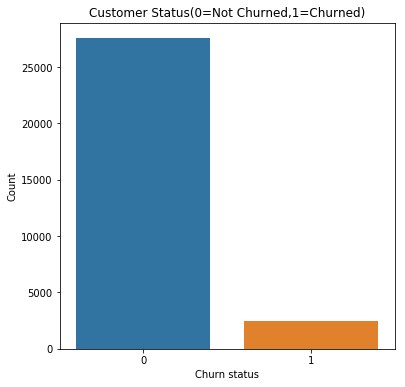

In [40]:
# Plot for the distribution of Churned vs Not Churned customers
plt.figure(figsize=(6, 6))
sns.countplot(x="Churn", data=telecom_hv_customer)
plt.title('Customer Status(0=Not Churned,1=Churned)')
plt.ylabel('Count')
plt.xlabel('Churn status')
plt.show()

#### Plot for the distribution of Churned vs Not Churned customers with respect to AON

In [41]:
telecom_hv_customer.aon.describe()

count    30001.000000
mean      1209.368754
std        957.677989
min        180.000000
25%        460.000000
50%        846.000000
75%       1756.000000
max       4321.000000
Name: aon, dtype: float64

Text(0,0.5,'Churned Count')

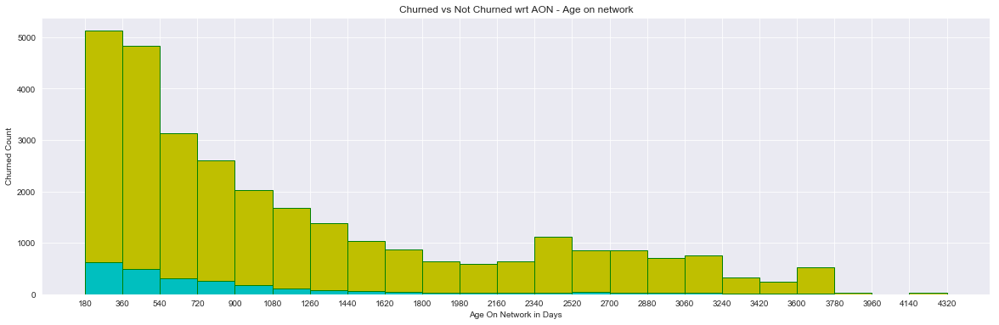

In [42]:
# Plot for the distribution of Churned vs Not Churned customers with respect to AON - Age on network - number of days 
# the customer is using the operator T network
# We can observe that number of churners get reduced as the Age on Network increases
sns.set_style("darkgrid")
plt.figure(figsize=(20, 6))
plt.title('Churned vs Not Churned wrt AON - Age on network')
plt.xticks(np.arange(180,4500,step=180))
ax=sns.distplot(telecom_hv_customer['aon'],kde=False,bins=np.arange(180,4500,180),kde_kws={"color": "k", "lw": 1.5}, 
                hist_kws={"histtype": "bar", "linewidth": 1,"align":"mid","alpha": 1, "color": "y","edgecolor":"g"})
ax=sns.distplot(telecom_hv_customer['aon'][telecom_hv_customer['Churn']== 1],kde=False,bins=np.arange(180,4500,180),
                kde_kws={"color": "k", "lw": 1.5}, hist_kws={"histtype": "bar", "linewidth": 1,"align":"mid","alpha": 1,
                                                             "color": "c","edgecolor":"g"})
ax.set_xlabel('Age On Network in Days')
ax.set_ylabel('Churned Count')

#### Plot for the distribution of Churned vs Not Churned customers with respect to Avg. Recharge in Jun-July

In [43]:
telecom_hv_customer.avg_total_recharge_6_7.quantile(0.99)

6090.5

Text(0,0.5,'Churned Count')

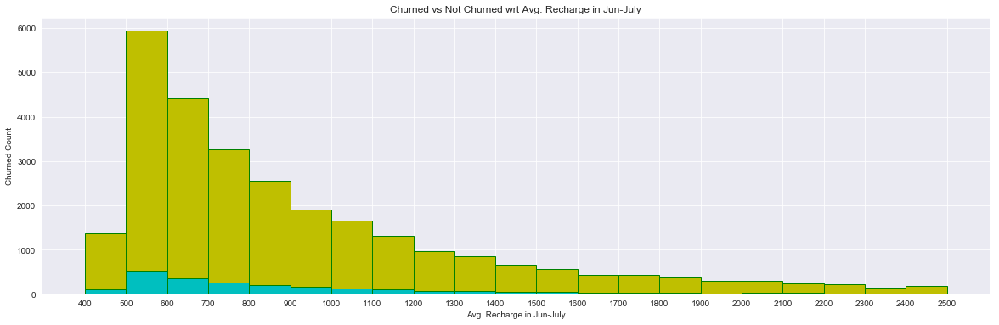

In [44]:
# Plot for the distribution of Churned vs Not Churned customers with respect to Avg. Recharge in Jun-July
# We can observe that number of churners get reduced as the avaerage recharge amount increases.
sns.set_style("darkgrid")
plt.figure(figsize=(20, 6))
plt.title('Churned vs Not Churned wrt Avg. Recharge in Jun-July')
plt.xticks(np.arange(400,2600,step=100))

ax=sns.distplot(telecom_hv_customer['avg_total_recharge_6_7'], kde=False,bins=np.arange(400,2600,100),
                kde_kws={"color": "k", "lw": 1.5}, 
                hist_kws={"histtype": "bar", "linewidth": 1,"align":"mid","alpha": 1, "color": "y","edgecolor":"g"})

ax=sns.distplot(telecom_hv_customer['avg_total_recharge_6_7'][telecom_hv_customer['Churn']== 1],
                kde=False,bins=np.arange(400,2600,100),kde_kws={"color": "k", "lw": 1.5}, 
                hist_kws={"histtype": "bar", "linewidth": 1,"align":"mid","alpha": 1, "color": "c","edgecolor":"g"})

ax.set_xlabel('Avg. Recharge in Jun-July')
ax.set_ylabel('Churned Count')

#### Plot for the distribution of Churned vs Not Churned customers with respect to Total Outgoing minutes in July

In [45]:
telecom_hv_customer.total_og_mou_7.describe()

count    30001.000000
mean       628.366047
std        717.219171
min          0.000000
25%        116.490000
50%        425.590000
75%        891.440000
max      11365.310000
Name: total_og_mou_7, dtype: float64

In [46]:
telecom_hv_customer.total_og_mou_7.quantile(0.999)

5766.440000000233

Text(0,0.5,'Churned Count')

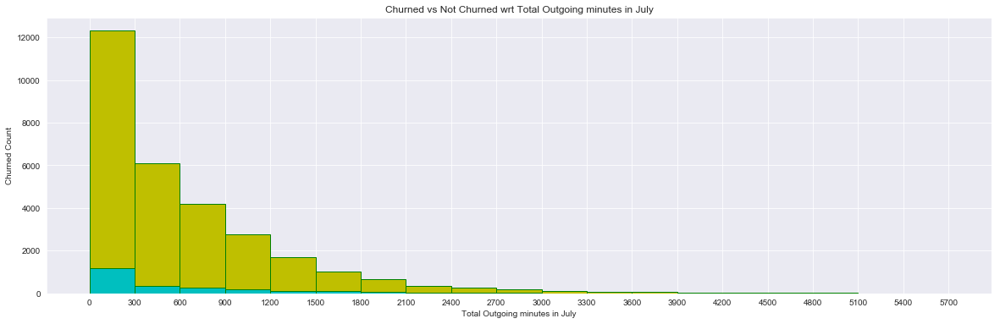

In [47]:
# Plot for the distribution of Churned vs Not Churned customers with respect to Total Outgoing minutes in July
# We can observe that number of churners get reduced as the total minutes of usage in outgoing minutes increases.
sns.set_style("darkgrid")
plt.figure(figsize=(20, 6))
plt.title('Churned vs Not Churned wrt Total Outgoing minutes in July')
plt.xticks(np.arange(0,6000,step=300))

ax=sns.distplot(telecom_hv_customer['total_og_mou_7'],kde=False,bins=np.arange(0,6000,300),
                kde_kws={"color": "k", "lw": 1.5}, 
                hist_kws={"histtype": "bar", "linewidth": 1,"align":"mid","alpha": 1, "color": "y","edgecolor":"g"})

ax=sns.distplot(telecom_hv_customer['total_og_mou_7'][telecom_hv_customer['Churn']== 1],
                kde=False,bins=np.arange(0,6000,300),kde_kws={"color": "k", "lw": 1.5}, 
                hist_kws={"histtype": "bar", "linewidth": 1,"align":"mid","alpha": 1, "color": "c","edgecolor":"g"})

ax.set_xlabel('Total Outgoing minutes in July')
ax.set_ylabel('Churned Count')

#### Plot for the distribution of Churned vs Not Churned customers with respect to Local Outgoing minutes in Aug

In [48]:
telecom_hv_customer.loc_og_mou_8.describe()

count    30001.000000
mean       235.728174
std        363.370172
min          0.000000
25%         22.460000
50%        110.810000
75%        310.610000
max      11039.910000
Name: loc_og_mou_8, dtype: float64

In [49]:
telecom_hv_customer.loc_og_mou_8.quantile(0.999)

3353.3900000000376

Text(0,0.5,'Churned Count')

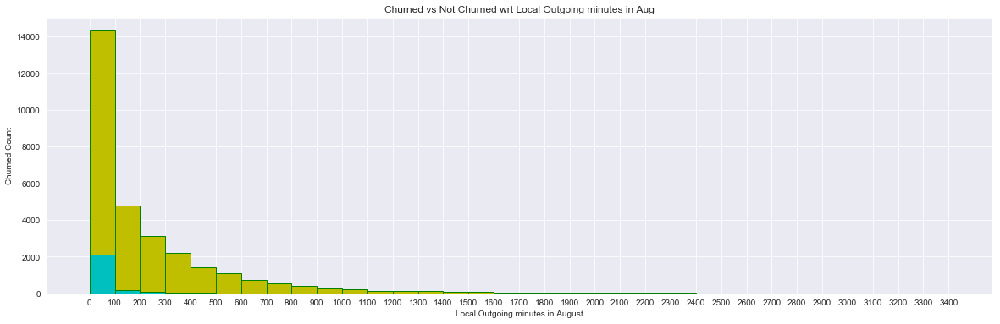

In [50]:
# Plot for the distribution of Churned vs Not Churned customers with respect to Local Outgoing minutes in Aug
# We can observe that number of churners get reduced as the Local Outgoing minutes in Aug increases.
sns.set_style("darkgrid")
plt.figure(figsize=(20, 6))
plt.title('Churned vs Not Churned wrt Local Outgoing minutes in Aug')
plt.xticks(np.arange(0,3500,step=100))

ax=sns.distplot(telecom_hv_customer['loc_og_mou_8'],kde=False,bins=np.arange(0,3500,100),
                kde_kws={"color": "k", "lw": 1.5}, 
                hist_kws={"histtype": "bar", "linewidth": 1,"align":"mid","alpha": 1, "color": "y","edgecolor":"g"})

ax=sns.distplot(telecom_hv_customer['loc_og_mou_8'][telecom_hv_customer['Churn']== 1],
                kde=False,bins=np.arange(0,3500,100),kde_kws={"color": "k", "lw": 1.5}, 
                hist_kws={"histtype": "bar", "linewidth": 1,"align":"mid","alpha": 1, "color": "c","edgecolor":"g"})

ax.set_xlabel('Local Outgoing minutes in August')
ax.set_ylabel('Churned Count')

# Step 3. Modelling

### 1. Test-Train Split

In [51]:
# Importing libraries for test-train split
from sklearn.model_selection import train_test_split

In [52]:
# Putting feature variable to X
X = telecom_hv_customer.drop(['Churn'], axis=1)
X.head()

,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,...,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,avg_total_recharge_6_7
0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,1,1,0,0,0,968,30.40,0.00,101.20,559.0
7,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,...,0,0,0,0,0,802,57.74,19.38,18.74,1185.0
8,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,...,0,0,0,0,0,315,21.03,910.65,122.16,696.0
21,102.41,132.11,85.14,757.93,896.68,983.39,0.00,0.00,0.00,0.00,...,0,0,0,0,0,720,0.00,0.00,0.00,640.0
23,48.96,50.66,33.58,85.41,89.36,205.89,0.00,0.00,0.00,0.00,...,2,1,0,0,1,604,40.45,51.86,0.00,583.0


In [53]:
# Putting response variable to y
y = telecom_hv_customer['Churn']
y.head()

0     1
7     1
8     0
21    0
23    0
Name: Churn, dtype: int32

In [54]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)

### 2. Feature Scaling

In [55]:
# Importing libraries for Standardization
from sklearn.preprocessing import StandardScaler

In [56]:
scaler = StandardScaler()

train_cols = X_train.columns
test_cols = X_test.columns

X_train[train_cols] = scaler.fit_transform(X_train[train_cols])
X_test[test_cols] = scaler.transform(X_test[test_cols])

X_train.head()

C:\Users\USER\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:645: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Users\USER\Anaconda3\lib\site-packages\sklearn\base.py:464: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)
C:\Users\USER\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  import sys


,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,...,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,avg_total_recharge_6_7
39186,-0.557530,-0.541565,-0.498528,-0.461376,-0.438796,-0.489079,0.166015,0.177751,0.252122,-0.178395,...,-0.34396,-0.343262,-0.211037,-0.207517,-0.184095,2.582178,-0.401980,-0.400504,-0.382233,0.024772
39833,-0.252141,-0.454845,-0.420576,-0.109409,-0.302716,-0.143763,-0.211944,-0.168046,-0.169673,-0.232413,...,-0.34396,-0.343262,-0.211037,-0.207517,-0.184095,1.209410,0.035010,-0.069847,0.288982,-0.189625
38778,-0.417911,-0.397984,-0.328062,-0.084162,-0.162412,-0.251206,0.019451,0.380352,0.757842,-0.029826,...,-0.34396,-0.343262,-0.211037,-0.207517,-0.184095,2.201087,-0.401980,-0.400504,-0.382233,-0.447051
43026,4.658430,-0.212796,1.006632,0.200074,-0.355665,0.453869,-0.211944,0.347666,0.139589,-0.232413,...,-0.34396,-0.343262,-0.211037,-0.207517,-0.184095,0.279843,-0.401980,-0.400504,-0.382233,-0.263229
12271,-0.531335,-0.462941,-0.457129,-0.388716,-0.155114,-0.522919,-0.211944,-0.168046,-0.169673,-0.232413,...,-0.34396,-0.343262,-0.211037,-0.207517,-0.184095,-0.967650,0.221756,0.510752,-0.086229,-0.364765


# Step 3.1 Model Building to Predict Churn

## PCA

### PCA on entire dataset
Finding required number of Principal Component

In [57]:
# Importing the PCA module
from sklearn.decomposition import PCA
pca1 = PCA(svd_solver='randomized', random_state=42)

# Doing PCA on the scaled dataframe
pca12 = pca1.fit(X_train)

In [58]:
np.cumsum(pca1.explained_variance_ratio_)

array([0.10470109, 0.19107602, 0.25030196, 0.29905677, 0.34485924,
       0.38068575, 0.4112654 , 0.43946746, 0.46602721, 0.49078835,
       0.51340766, 0.53539989, 0.55670936, 0.57735874, 0.5961336 ,
       0.61432843, 0.63038926, 0.64584713, 0.66101246, 0.67592263,
       0.68981959, 0.70212404, 0.71417468, 0.72502034, 0.73553342,
       0.74572097, 0.75571437, 0.76500122, 0.77399525, 0.78228309,
       0.79034342, 0.79805128, 0.80540827, 0.81274307, 0.81980324,
       0.82660751, 0.83317849, 0.83966248, 0.84609239, 0.85234421,
       0.85833538, 0.86395213, 0.86936661, 0.87469158, 0.87964069,
       0.88442385, 0.88894109, 0.89323981, 0.89742258, 0.90124139,
       0.90499044, 0.90869522, 0.91235818, 0.91592468, 0.9193602 ,
       0.92276817, 0.92591941, 0.9290356 , 0.93202675, 0.93499281,
       0.9378389 , 0.94060297, 0.94329852, 0.94583492, 0.94832371,
       0.95068813, 0.95298888, 0.95527714, 0.95744187, 0.95955754,
       0.96165237, 0.96368321, 0.96567553, 0.96765047, 0.96956

In [59]:
# Checking the cumulative variance explained by Principal Component
variance_ratio_cum_sum=np.cumsum(np.round(pca1.explained_variance_ratio_, decimals=4)*100)
print(variance_ratio_cum_sum)

[ 10.47  19.11  25.03  29.91  34.49  38.07  41.13  43.95  46.61  49.09
  51.35  53.55  55.68  57.74  59.62  61.44  63.05  64.6   66.12  67.61
  69.    70.23  71.44  72.52  73.57  74.59  75.59  76.52  77.42  78.25
  79.06  79.83  80.57  81.3   82.01  82.69  83.35  84.    84.64  85.27
  85.87  86.43  86.97  87.5   87.99  88.47  88.92  89.35  89.77  90.15
  90.52  90.89  91.26  91.62  91.96  92.3   92.62  92.93  93.23  93.53
  93.81  94.09  94.36  94.61  94.86  95.1   95.33  95.56  95.78  95.99
  96.2   96.4   96.6   96.8   96.99  97.17  97.34  97.51  97.68  97.85
  98.01  98.17  98.33  98.49  98.64  98.79  98.93  99.06  99.19  99.3
  99.41  99.51  99.61  99.7   99.77  99.83  99.89  99.94  99.99 100.02
 100.04 100.05 100.05 100.05 100.05 100.05 100.05 100.05 100.05 100.05
 100.05 100.05 100.05 100.05 100.05 100.05 100.05 100.05 100.05 100.05
 100.05 100.05 100.05 100.05 100.05 100.05 100.05 100.05]


In [60]:
# Principal Component 1 and Principal Component 1 with respect to original features
colnames = list(X_train.columns)
pcs_df = pd.DataFrame({'PC1':pca1.components_[0],'PC2':pca1.components_[1], 'Feature':colnames})
print(pcs_df.shape)
pcs_df.head(10)

(128, 3)


,PC1,PC2,Feature
0,0.122359,0.112831,onnet_mou_6
1,0.132120,0.125491,onnet_mou_7
2,0.132336,0.109310,onnet_mou_8
3,0.164707,0.059230,offnet_mou_6
4,0.171689,0.074868,offnet_mou_7
5,0.166144,0.056388,offnet_mou_8
6,0.019670,0.004564,roam_ic_mou_6
7,0.010517,0.002230,roam_ic_mou_7
8,0.015337,0.002937,roam_ic_mou_8
9,0.022191,0.027047,roam_og_mou_6


#### Plot for Principal Component 1 (PC1) vs Principal Component 2(PC2)

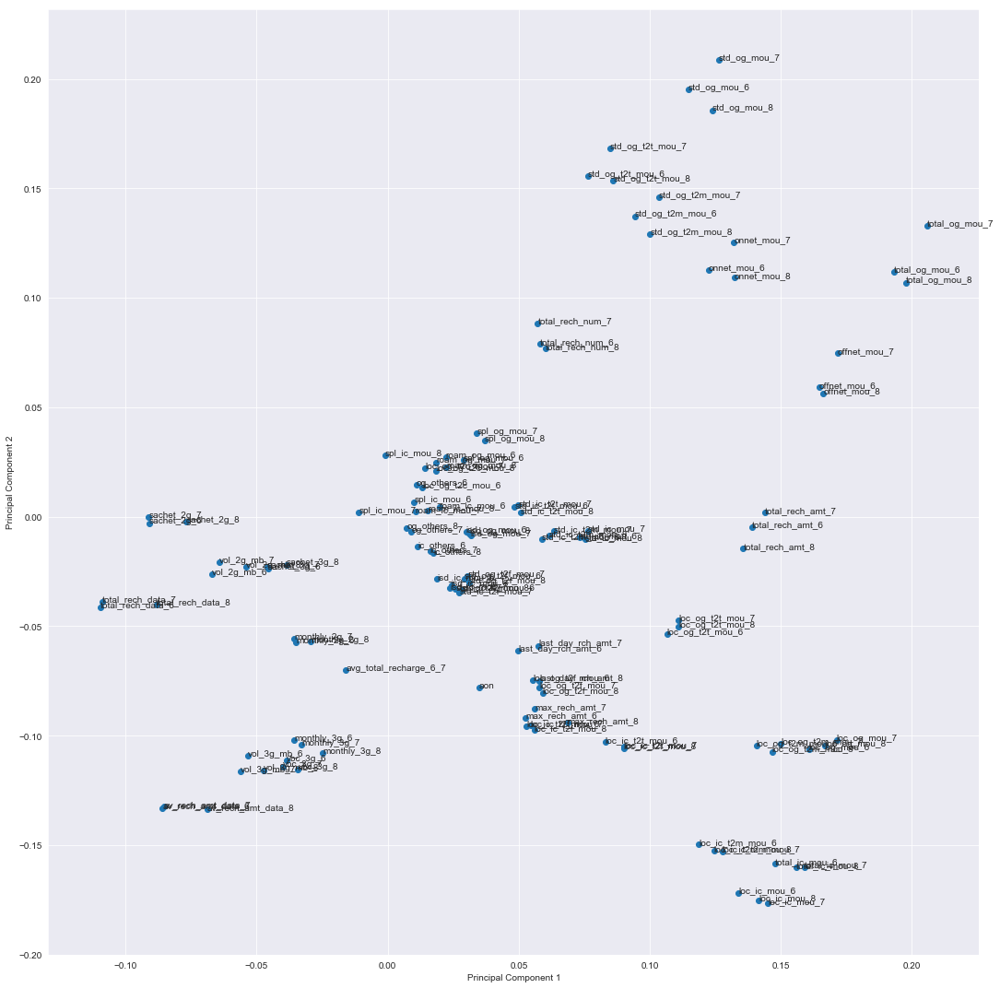

In [61]:
# Plot for PC1 vs PC2
%matplotlib inline
fig = plt.figure(figsize = (15,15))
plt.scatter(pcs_df.PC1, pcs_df.PC2)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
for i, txt in enumerate(pcs_df.Feature):
    plt.annotate(txt, (pcs_df.PC1[i],pcs_df.PC2[i]))
plt.tight_layout()
plt.show()

#### Scree plot 
Scree plot i.e cumulative variance against the number of components to identify optimal number of components

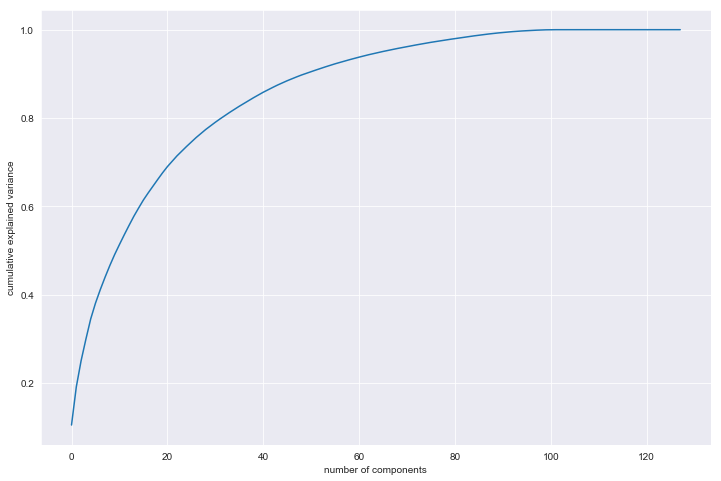

In [62]:
# Making the screeplot - plotting the cumulative variance against the number of components
%matplotlib inline
fig = plt.figure(figsize = (12,8))
plt.plot(np.cumsum(pca1.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

#### Looks like 66 components are enough to describe 95% of the variance in the dataset
- We'll choose 66 components for our modeling

### PCA using 66 Principal Components

In [63]:
# Importing the PCA module
from sklearn.decomposition import PCA
pca_final = PCA(n_components=66,svd_solver='randomized', random_state=42)

In [64]:
# For train data
n_components = 67 # No. of PC+1 for column name
df_train_pca = pd.DataFrame(pca_final.fit_transform(X_train), columns=['PCA%i' % i for i in range(1,n_components)])
df_train_pca.head()

,PCA1,PCA2,PCA3,PCA4,PCA5,PCA6,PCA7,PCA8,PCA9,PCA10,...,PCA57,PCA58,PCA59,PCA60,PCA61,PCA62,PCA63,PCA64,PCA65,PCA66
0,-0.610076,-0.711728,-0.496015,-3.117208,0.305788,1.602784,2.796005,2.891831,0.263785,1.182028,...,-0.015797,0.221559,-0.080736,0.324406,0.374897,0.233710,0.044764,-0.207823,-0.024539,-0.146752
1,-0.509805,-1.568789,-1.285708,-0.194789,0.351056,0.570245,0.419809,-0.818302,1.083358,-0.060557,...,0.104648,-0.626725,0.684255,0.110470,0.548480,-0.338446,0.243614,0.752286,-0.699695,0.105721
2,-1.164775,0.333975,-1.858888,-0.584966,0.380152,0.495238,0.468009,-0.109512,-1.020962,-0.284426,...,-0.196268,0.200083,-0.041942,0.230616,0.377522,0.003893,-0.057521,-0.063884,0.270659,0.040885
3,7.889702,-0.516989,-0.850344,0.981090,6.807692,-3.759661,0.412281,0.324974,-0.635101,0.481603,...,0.523707,2.599477,-1.903322,-0.007044,0.025582,-2.684250,6.117692,-1.682140,0.956228,-1.278658
4,-0.570438,-2.289533,-1.837855,-0.079654,0.042681,-0.198919,-1.134803,1.341657,0.700281,0.177101,...,0.094975,0.258888,-0.190717,0.291441,0.351940,0.365090,0.158376,-1.202105,0.405454,0.088447


In [65]:
# For test data
n_components = 67 # No. of PC+1 for column name
df_test_pca = pd.DataFrame(pca_final.transform(X_test), columns=['PCA%i' % i for i in range(1,n_components)])
df_test_pca.head()

,PCA1,PCA2,PCA3,PCA4,PCA5,PCA6,PCA7,PCA8,PCA9,PCA10,...,PCA57,PCA58,PCA59,PCA60,PCA61,PCA62,PCA63,PCA64,PCA65,PCA66
0,-2.467759,0.961355,-1.729968,-1.916838,0.012907,0.180287,0.503574,0.399799,0.058240,0.405784,...,0.122211,-0.220247,0.191397,-0.397310,-0.075238,0.118854,-0.047331,-0.362766,-0.245402,-0.071279
1,-4.360321,1.248057,-1.532991,1.871573,0.379092,0.577163,0.844259,-0.453488,0.159022,-0.140194,...,-0.192168,0.103808,0.043437,-0.114787,0.334830,-0.152390,-0.214337,-0.017623,-0.145989,-0.006077
2,3.717119,-2.128521,-0.370760,0.815424,-1.861347,0.729463,-0.579747,-1.661587,-1.163384,0.910177,...,0.335837,0.025898,-0.113946,-0.300183,-0.718128,0.127142,-0.014502,0.543020,0.609142,-0.064059
3,-0.079635,0.534562,-2.286945,0.128473,0.224755,0.384676,-0.328377,0.372453,-0.641581,0.626777,...,0.015656,-0.007405,-0.063607,-0.056745,-0.127807,-0.178588,0.166908,-0.009099,0.048365,-0.093114
4,-1.602503,-0.101966,0.533279,-0.324632,0.131427,-1.607982,-0.931657,0.940678,0.946517,0.285849,...,-0.212049,0.072659,0.378684,0.021080,1.362995,-0.149812,0.418042,-0.206051,0.002681,-0.601564


## Model 1 - Logistic regression on Principal Components
First model we will train on PCA component is Logistic Regression model.

In [66]:
# Training the model on the train data
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

learner_pca = LogisticRegression(class_weight='balanced') # Logistic Regression
model_pca = learner_pca.fit(df_train_pca,y_train) # Fitting on train data

In [67]:
# Making prediction on the train data
# ROC_AUC score
pred_probs_train = model_pca.predict_proba(df_train_pca)[:,1]
"{:2.2}".format(metrics.roc_auc_score(y_train, pred_probs_train))

'0.9'

#### Making Predictions

In [68]:
# Predicted probabilities
y_pred = model_pca.predict_proba(df_train_pca)

# Converting y_pred to a dataframe which is an array
y_pred_df = pd.DataFrame(y_pred)

# Converting to column dataframe
y_pred_1 = y_pred_df.iloc[:,[1]]
y_pred_1.head()

,1
0,0.530716
1,0.081340
2,0.257323
3,0.000043
4,0.085400


In [69]:
# Converting y_train to dataframe
y_train_df = pd.DataFrame(data = y_train)
y_train_df= y_train_df.rename(columns={ 0 : 'Churn'})
y_train_df.head()

,Churn
39186,0
39833,0
38778,0
43026,0
12271,0


In [70]:
# Putting CustID to index
y_train_df['CustID'] = y_train_df.index

# Removing index for both dataframes to append them side by side 
y_pred_1.reset_index(drop=True, inplace=True)
y_train_df.reset_index(drop=True, inplace=True)

# Appending y_test_df and y_pred_1
y_pred_final = pd.concat([y_train_df,y_pred_1],axis=1)

# Renaming the column 
y_pred_final= y_pred_final.rename(columns={ 1 : 'Churn_Prob'})

# Rearranging the columns
y_pred_final = y_pred_final.reindex_axis(['CustID','Churn','Churn_Prob'], axis=1)
y_pred_final.head()

,CustID,Churn,Churn_Prob
0,39186,0,0.530716
1,39833,0,0.081340
2,38778,0,0.257323
3,43026,0,0.000043
4,12271,0,0.085400


### Finding Optimal Cutoff Point

In [71]:
#Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_pred_final[i]= y_pred_final.Churn_Prob.map(lambda x: 1 if x > i else 0)
y_pred_final.head(10)

,CustID,Churn,Churn_Prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,39186,0,0.530716,1,1,1,1,1,1,0,0,0,0
1,39833,0,0.081340,1,0,0,0,0,0,0,0,0,0
2,38778,0,0.257323,1,1,1,0,0,0,0,0,0,0
3,43026,0,0.000043,1,0,0,0,0,0,0,0,0,0
4,12271,0,0.085400,1,0,0,0,0,0,0,0,0,0
5,33607,0,0.026228,1,0,0,0,0,0,0,0,0,0
6,51913,0,0.171391,1,1,0,0,0,0,0,0,0,0
7,16668,0,0.053135,1,0,0,0,0,0,0,0,0,0
8,54924,0,0.198984,1,1,0,0,0,0,0,0,0,0
9,33733,0,0.405552,1,1,1,1,1,0,0,0,0,0


In [72]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci','precision','recall'])
from sklearn.metrics import confusion_matrix

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_pred_final.Churn, y_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    
    precision = cm1[1,1]/(cm1[1,1]+cm1[0,1])
    recall = cm1[1,1]/(cm1[1,1]+cm1[1,0])
    
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci,precision, recall ]
print(cutoff_df)

     prob  accuracy     sensi     speci  precision    recall
0.0   0.0  0.080524  1.000000  0.000000   0.080524  1.000000
0.1   0.1  0.416095  0.975163  0.367134   0.118898  0.975163
0.2   0.2  0.561762  0.947368  0.527992   0.149496  0.947368
0.3   0.3  0.661286  0.926079  0.638096   0.183072  0.926079
0.4   0.4  0.741619  0.891189  0.728520   0.223292  0.891189
0.5   0.5  0.806000  0.846245  0.802476   0.272831  0.846245
0.6   0.6  0.861048  0.782969  0.867885   0.341677  0.782969
0.7   0.7  0.899000  0.695446  0.916826   0.422717  0.695446
0.8   0.8  0.921619  0.549970  0.954166   0.512397  0.549970
0.9   0.9  0.924762  0.231815  0.985447   0.582467  0.231815


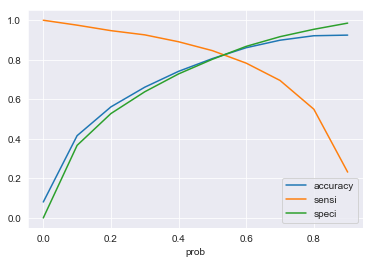

In [73]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

We can observe from the above plot that __the optimal value is 0.52__ for Churn Probability

In [74]:
# Predicting final_predicted for churn
y_pred_final['final_predicted'] = y_pred_final.Churn_Prob.map( lambda x: 1 if x > 0.52 else 0)

y_pred_final.head()

,CustID,Churn,Churn_Prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,39186,0,0.530716,1,1,1,1,1,1,0,0,0,0,1
1,39833,0,0.081340,1,0,0,0,0,0,0,0,0,0,0
2,38778,0,0.257323,1,1,1,0,0,0,0,0,0,0,0
3,43026,0,0.000043,1,0,0,0,0,0,0,0,0,0,0
4,12271,0,0.085400,1,0,0,0,0,0,0,0,0,0,0


### Model evaluation on train data

In [75]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_pred_final.Churn, y_pred_final.final_predicted)

0.8188571428571428

In [76]:
confusion1 = metrics.confusion_matrix(y_pred_final.Churn, y_pred_final.final_predicted )
confusion1

array([[15791,  3518],
       [  286,  1405]], dtype=int64)

In [77]:
TP = confusion1[1,1] # true positive 
TN = confusion1[0,0] # true negatives
FP = confusion1[0,1] # false positives
FN = confusion1[1,0] # false negatives

In [78]:
# Let's see the sensitivity of our logistic regression model
print("Sensitivity",TP / float(TP+FN))
print("\n")

# Let us calculate specificity
print("Specificity",TN / float(TN+FP))

Sensitivity 0.830869308101715


Specificity 0.81780516857424


In [79]:
# draw_roc(y_pred_final.Churn, y_pred_final.predicted)
"{:2.2f}".format(metrics.roc_auc_score(y_pred_final.Churn, y_pred_final.Churn_Prob))

'0.90'

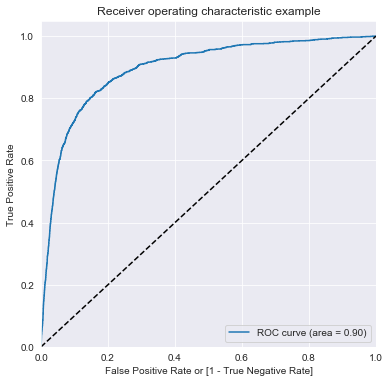

In [80]:
# Plotting ROC curve
fpr, tpr, thresholds = metrics.roc_curve(y_pred_final.Churn, y_pred_final.Churn_Prob, drop_intermediate = False )
auc_score = metrics.roc_auc_score(y_pred_final.Churn, y_pred_final.Churn_Prob)
plt.figure(figsize=(6, 6))
plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

### Model evaluation on test data

In [81]:
y_test_pred1 = model_pca.predict(df_test_pca)

In [82]:
# Converting y_test_pred to a dataframe which is an array
y_pred_1 = pd.DataFrame(y_test_pred1)
y_pred_1.head()

,0
0,1
1,0
2,0
3,0
4,1


In [83]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)

# Putting LeadID to index
y_test_df['CustId'] = y_test_df.index

# Removing index for both dataframes to append them side by side 
y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

# Appending y_test_df and y_pred_1
y_pred_final = pd.concat([y_test_df, y_pred_1],axis=1)

# Renaming the column 
y_pred_final= y_pred_final.rename(columns={ 0 : 'Churn_Prob'})

In [84]:
# Predicting on the test data from the optimal value obtained from train
y_pred_final['final_predicted'] = y_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.52 else 0)
y_pred_final.head()

,Churn,CustId,Churn_Prob,final_predicted
0,1,20296,1,1
1,1,8279,0,0
2,0,72269,0,0
3,0,65602,0,0
4,1,42758,1,1


In [85]:
#Let's check the overall accuracy.
metrics.accuracy_score(y_pred_final.Churn, y_pred_final.final_predicted)

0.8167981335407177

In [86]:
# Confusion matrix 
confusion1_1 = metrics.confusion_matrix(y_pred_final.Churn, y_pred_final.final_predicted)
confusion1_1

array([[6725, 1526],
       [ 123,  627]], dtype=int64)

In [87]:
TP1 = confusion1_1[1,1] # true positive 
TN1 = confusion1_1[0,0] # true negatives
FP1 = confusion1_1[0,1] # false positives
FN1 = confusion1_1[1,0] # false negatives

In [88]:
# Let's see the sensitivity of our logistic regression model
print("Sensitivity",TP1 / float(TP1+FN1))

# Let us calculate specificity
print("Specificity",TN1 / float(TN1+FP1))

Sensitivity 0.836
Specificity 0.8150527208823173


In [89]:
# Making prediction on the test data
pred_probs_test = model_pca.predict_proba(df_test_pca)[:,1]
"{:2.2}".format(metrics.roc_auc_score(y_test, pred_probs_test))

'0.89'

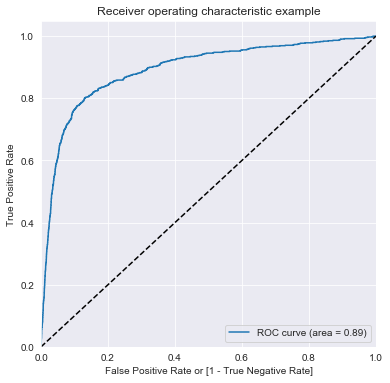

In [90]:
# Plotting ROC curve
fpr, tpr, thresholds = metrics.roc_curve(y_test, pred_probs_test, drop_intermediate = False )
auc_score = metrics.roc_auc_score(y_test, pred_probs_test)
plt.figure(figsize=(6, 6))
plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

# Model 2 - Decision Tree on Principal Components
Second model we will train on our principal components is Decision Tree

### Default Hyperparameters
Let's first fit a decision tree model with default hyperparameters.

In [91]:
# Importing decision tree classifier from sklearn library
from sklearn.tree import DecisionTreeClassifier

# Fitting the decision tree with default hyperparameters, apart from
# max_depth which is 5 so that we can plot and read the tree.

dt_default = DecisionTreeClassifier(max_depth=5,random_state = 100,class_weight={0:0.1, 1: 0.9})
dt_default.fit(df_train_pca, y_train)

DecisionTreeClassifier(class_weight={0: 0.1, 1: 0.9}, criterion='gini',
            max_depth=5, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=100,
            splitter='best')

In [92]:
# Let's check the evaluation metrics of our default model

# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Making predictions
y_pred_train_default = dt_default.predict(df_train_pca) # For train data
y_pred_test_default = dt_default.predict(df_test_pca) # For test data

In [93]:
# Printing confusion matrix and accuracy
# For train
print("For train data")
print(confusion_matrix(y_train, y_pred_train_default))
print(accuracy_score(y_train, y_pred_train_default))
print("\n")

# For test
print("For test data")
print(confusion_matrix(y_test, y_pred_test_default))
print(accuracy_score(y_test, y_pred_test_default))

For train data
[[15821  3488]
 [  387  1304]]
0.8154761904761905


For test data
[[6734 1517]
 [ 206  544]]
0.8085768247972448


### Hyperparameter Tuning

The default tree is quite complex, and we need to simplify it by tuning the hyperparameters. 

First, let's understand the parameters in a decision tree. 

- **criterion** (Gini/IG or entropy): It defines the function to measure the quality of a split. Sklearn supports “gini” criteria for Gini Index & “entropy” for Information Gain. By default, it takes the value “gini”.
- **max_features**: It defines the no. of features to consider when looking for the best split. We can input integer, float, string & None value.
- **max_depth**: The max_depth parameter denotes maximum depth of the tree. It can take any integer value or None. If None, then nodes are expanded until all leaves are pure or until all leaves contain less than min_samples_split samples. By default, it takes “None” value.
- **min_samples_split**: This tells above the minimum no. of samples reqd. to split an internal node. If an integer value is taken then consider min_samples_split as the minimum no. If float, then it shows percentage. By default, it takes “2” value.
- **min_samples_leaf**: The minimum number of samples required to be at a leaf node. If an integer value is taken then consider - -min_samples_leaf as the minimum no. If float, then it shows percentage. By default, it takes “1” value.
- **max_leaf_nodes**: It defines the maximum number of possible leaf nodes. If None then it takes an unlimited number of leaf nodes. By default, it takes “None” value.

### Grid Search to Find Optimal Hyperparameters

We can now use GridSearchCV to find multiple optimal hyperparameters together. Note that this time, we'll also specify the criterion (gini/entropy or IG).

In [94]:
# Create the parameter grid 
param_grid = {
    'max_depth': range(5, 15, 2),
    'min_samples_leaf': range(50, 150, 50),
    'min_samples_split': range(50, 150, 50),
    'criterion': ["entropy", "gini"]
}

n_folds = 5

# Instantiate the grid search model
dtree = DecisionTreeClassifier(random_state = 100,class_weight={0:0.1, 1: 0.9})
grid_search = GridSearchCV(estimator = dtree, param_grid = param_grid, 
                          cv = n_folds, n_jobs = -1, verbose = 1)

# Fit the grid search to the data
grid_search.fit(df_train_pca,y_train)

Fitting 5 folds for each of 40 candidates, totalling 200 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   33.1s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:  2.1min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight={0: 0.1, 1: 0.9}, criterion='gini',
            max_depth=None, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=100,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'max_depth': range(5, 15, 2), 'min_samples_leaf': range(50, 150, 50), 'min_samples_split': range(50, 150, 50), 'criterion': ['entropy', 'gini']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [95]:
# cv results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,2.316690,0.013392,0.006251,0.007656,entropy,5,50,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.787908,...,0.774571,0.026420,39,0.794393,0.749226,0.785298,0.784107,0.826498,0.787904,0.024693
1,2.311412,0.005129,0.003125,0.006249,entropy,5,50,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.787908,...,0.774571,0.026420,39,0.794393,0.749226,0.785298,0.784107,0.826498,0.787904,0.024693
2,2.445787,0.154691,0.006250,0.007655,entropy,5,100,50,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.791240,...,0.778000,0.027387,37,0.800643,0.756607,0.785774,0.785952,0.831081,0.792012,0.024208
3,2.323022,0.151467,0.004827,0.005727,entropy,5,100,100,"{'criterion': 'entropy', 'max_depth': 5, 'min_...",0.791240,...,0.778000,0.027387,37,0.800643,0.756607,0.785774,0.785952,0.831081,0.792012,0.024208
4,2.995203,0.053926,0.000000,0.000000,entropy,7,50,50,"{'criterion': 'entropy', 'max_depth': 7, 'min_...",0.815282,...,0.808857,0.019394,3,0.837967,0.834167,0.797143,0.844702,0.839950,0.830786,0.017161


In [96]:
# printing the optimal accuracy score and hyperparameters
print("best accuracy", grid_search.best_score_)
print(grid_search.best_estimator_)

best accuracy 0.8102380952380952
DecisionTreeClassifier(class_weight={0: 0.1, 1: 0.9}, criterion='gini',
            max_depth=7, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=50, min_samples_split=50,
            min_weight_fraction_leaf=0.0, presort=False, random_state=100,
            splitter='best')


### Running the model with best parameters obtained from grid search

In [97]:
# model with optimal hyperparameters
clf_gini = DecisionTreeClassifier(criterion = "gini", 
                                  random_state = 100,
                                  max_depth=7, 
                                  min_samples_leaf=50,
                                  min_samples_split=50,
                                 class_weight={0:0.1, 1: 0.9}) # Handling class imbalance
clf_gini.fit(df_train_pca, y_train)

DecisionTreeClassifier(class_weight={0: 0.1, 1: 0.9}, criterion='gini',
            max_depth=7, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=50, min_samples_split=50,
            min_weight_fraction_leaf=0.0, presort=False, random_state=100,
            splitter='best')

### Model evaluation on train data

In [98]:
# Predicting on PCA train dataframe
from sklearn.metrics import classification_report,confusion_matrix
y_train_pred2 = clf_gini.predict(df_train_pca)

In [99]:
# Accuracy
print("Accuracy:",metrics.accuracy_score(y_train, y_train_pred2))

Accuracy: 0.8327142857142857


In [100]:
# confusion matrix
confusion2 = confusion_matrix(y_train, y_train_pred2)
print(confusion2)

[[16114  3195]
 [  318  1373]]


In [101]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

# Let's see the sensitivity of our logistic regression model
print("Sensitivity:",TP / float(TP+FN))
print("\n")

# Let us calculate specificity
print("Specificity:",TN / float(TN+FP))

Sensitivity: 0.8119455943228858


Specificity: 0.8345331192708063


In [102]:
# Making prediction on the train data
pred_probs_train = clf_gini.predict_proba(df_train_pca)[:,1]
"{:2.2}".format(metrics.roc_auc_score(y_train, pred_probs_train))

'0.9'

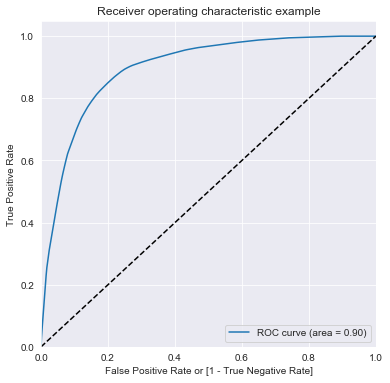

In [103]:
# Plotting ROC curve
fpr, tpr, thresholds = metrics.roc_curve(y_train, pred_probs_train, drop_intermediate = False )
auc_score = metrics.roc_auc_score(y_train, pred_probs_train)
plt.figure(figsize=(6, 6))
plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

### Model evaluation on test data

In [104]:
# Predicting on PCA test dataframe using predict
from sklearn.metrics import classification_report,confusion_matrix
y_test_pred2 = clf_gini.predict(df_test_pca)

In [105]:
# Accuracy
print("Accuracy:",metrics.accuracy_score(y_test, y_test_pred2))

Accuracy: 0.8176869236751472


In [106]:
# confusion matrix
confusion2_1 = confusion_matrix(y_test, y_test_pred2)
print(confusion2_1)

[[6833 1418]
 [ 223  527]]


In [107]:
TP = confusion2_1[1,1] # true positive 
TN = confusion2_1[0,0] # true negatives
FP = confusion2_1[0,1] # false positives
FN = confusion2_1[1,0] # false negatives

# Let's see the sensitivity of our logistic regression model
print("Sensitivity:",TP / float(TP+FN))
print("\n")

# Let us calculate specificity
print("Specificity:",TN / float(TN+FP))

Sensitivity: 0.7026666666666667


Specificity: 0.8281420433886801


In [108]:
# Predicting on PCA test dataframe using probability for roc_auc
pred_probs_test = clf_gini.predict_proba(df_test_pca)[:,1]
"{:2.2}".format(metrics.roc_auc_score(y_test, pred_probs_test))

'0.81'

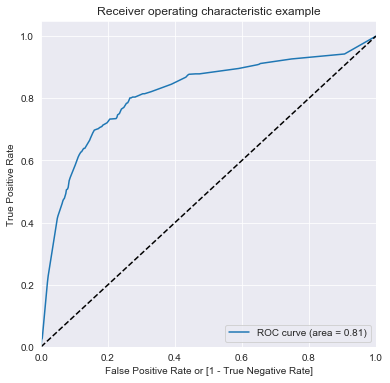

In [109]:
# Plotting ROC curve
fpr, tpr, thresholds = metrics.roc_curve(y_test, pred_probs_test, drop_intermediate = False )
auc_score = metrics.roc_auc_score(y_test, pred_probs_test)
plt.figure(figsize=(6, 6))
plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

# Model 3 - Random Forest on Principal Components
Third model we will train on our principal components is Random Forest

### Default Hyperparameters

Let's first fit a random forest model with default hyperparameters.

In [110]:
# Importing random forest classifier from sklearn library
from sklearn.ensemble import RandomForestClassifier

# Running the random forest with default parameters.
rfc = RandomForestClassifier(random_state = 100, class_weight={0:0.1, 1: 0.9})

# fit
rfc.fit(df_train_pca,y_train)

RandomForestClassifier(bootstrap=True, class_weight={0: 0.1, 1: 0.9},
            criterion='gini', max_depth=None, max_features='auto',
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=10, n_jobs=None, oob_score=False,
            random_state=100, verbose=0, warm_start=False)

In [111]:
# Let's check the evaluation metrics of our default model

# Importing classification report and confusion matrix from sklearn metrics
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Making predictions
y_pred_train_default2 = rfc.predict(df_train_pca) # For train data
y_pred_test_default2 = rfc.predict(df_test_pca) # For test data

In [112]:
# Printing confusion matrix and accuracy
# For train
print("For train data")
print(confusion_matrix(y_train, y_pred_train_default2))
print(accuracy_score(y_train, y_pred_train_default2))
print("\n")

# For test
print("For test data")
print(confusion_matrix(y_test, y_pred_test_default2))
print(accuracy_score(y_test, y_pred_test_default2))

For train data
[[19309     0]
 [  209  1482]]
0.9900476190476191


For test data
[[8201   50]
 [ 674   76]]
0.9195644928341296


### Hyperparameter Tuning

The following hyperparameters are present in a random forest classifier. Note that most of these hypereparameters are actually of the decision trees that are in the forest.


- **n_estimators**: integer, optional (default=10): The number of trees in the forest.
- **criterion**: string, optional (default=”gini”)The function to measure the quality of a split. Supported criteria are “gini” for the Gini impurity and “entropy” for the information gain. Note: this parameter is tree-specific.
- **max_features** : int, float, string or None, optional (default=”auto”)The number of features to consider when looking for the best split:
- **max_depth** : integer or None, optional (default=None)The maximum depth of the tree. If None, then nodes are expanded until all leaves are pure or until all leaves contain less than min_samples_split samples.
- **min_samples_split** : int, float, optional (default=2)The minimum number of samples required to split an internal node:**
- **min_samples_leaf** : int, float, optional (default=1)The minimum number of samples required to be at a leaf node:**
- **max_leaf_nodes** : int or None, optional (default=None)Grow trees with max_leaf_nodes in best-first fashion. Best nodes are defined as relative reduction in impurity. If None then unlimited number of leaf nodes.

### Grid Search to Find Optimal Hyperparameters

We can now find the optimal hyperparameters using GridSearchCV.

In [113]:
# Create the parameter grid based on the results of random search 
param_grid = {
    'max_depth': [4,8,10],
    'min_samples_leaf': range(100, 400, 200),
    'min_samples_split': range(200, 500, 200),
    'n_estimators': [100,200,300], 
    'max_features': [5, 10]
}

# Create a based model
rf = RandomForestClassifier(random_state = 100,class_weight={0:0.1, 1: 0.9})

# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1,verbose = 1)

In [114]:
# Fit the grid search to the data
grid_search.fit(df_train_pca, y_train)

Fitting 3 folds for each of 72 candidates, totalling 216 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 216 out of 216 | elapsed: 15.2min finished


GridSearchCV(cv=3, error_score='raise-deprecating',
       estimator=RandomForestClassifier(bootstrap=True, class_weight={0: 0.1, 1: 0.9},
            criterion='gini', max_depth=None, max_features='auto',
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators='warn', n_jobs=None, oob_score=False,
            random_state=100, verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'max_depth': [4, 8, 10], 'min_samples_leaf': range(100, 400, 200), 'min_samples_split': range(200, 500, 200), 'n_estimators': [100, 200, 300], 'max_features': [5, 10]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [115]:
# printing the optimal accuracy score and hyperparameters
print("best accuracy", grid_search.best_score_)
print(grid_search.best_estimator_)

best accuracy 0.8971904761904762
RandomForestClassifier(bootstrap=True, class_weight={0: 0.1, 1: 0.9},
            criterion='gini', max_depth=4, max_features=5,
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=100,
            min_samples_split=400, min_weight_fraction_leaf=0.0,
            n_estimators=300, n_jobs=None, oob_score=False,
            random_state=100, verbose=0, warm_start=False)


### Fitting the final model with the best parameters obtained from grid search

In [116]:
# model with the best hyperparameters
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(bootstrap=True,
                             max_depth=4,
                             max_features=5,
                             min_samples_leaf=100, 
                             min_samples_split=400,
                             n_estimators=300,
                             class_weight={0:0.1, 1: 0.9}, # Handling class imbalance
                            random_state = 100)

# fit
rfc.fit(df_train_pca,y_train)

RandomForestClassifier(bootstrap=True, class_weight={0: 0.1, 1: 0.9},
            criterion='gini', max_depth=4, max_features=5,
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=100,
            min_samples_split=400, min_weight_fraction_leaf=0.0,
            n_estimators=300, n_jobs=None, oob_score=False,
            random_state=100, verbose=0, warm_start=False)

### Model evaluation on train data

In [117]:
# Predicting on PCA test dataframe using predict
from sklearn.metrics import classification_report,confusion_matrix
y_train_pred2 = rfc.predict(df_train_pca)

In [118]:
# Accuracy
print("Accuracy:",metrics.accuracy_score(y_train, y_train_pred2))

Accuracy: 0.8992857142857142


In [119]:
# confusion matrix
confusion3 = confusion_matrix(y_train, y_train_pred2)
print(confusion3)

[[17783  1526]
 [  589  1102]]


In [120]:
TP = confusion3[1,1] # true positive 
TN = confusion3[0,0] # true negatives
FP = confusion3[0,1] # false positives
FN = confusion3[1,0] # false negatives

# Let's see the sensitivity of our logistic regression model
print("Sensitivity:",TP / float(TP+FN))
print("\n")

# Let us calculate specificity
print("Specificity:",TN / float(TN+FP))

Sensitivity: 0.651685393258427


Specificity: 0.9209694960899063


In [121]:
# Predicting on PCA test dataframe using probability for roc_auc
pred_probs_train = rfc.predict_proba(df_train_pca)[:,1]
"{:2.2}".format(metrics.roc_auc_score(y_train, pred_probs_train))

'0.9'

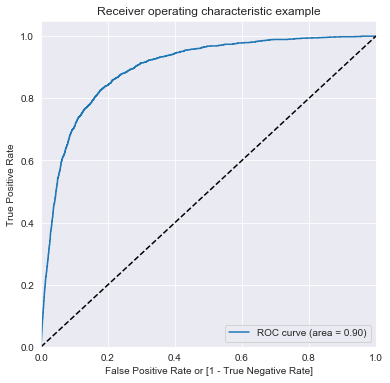

In [122]:
# Plotting ROC curve
fpr, tpr, thresholds = metrics.roc_curve(y_train, pred_probs_train, drop_intermediate = False )
auc_score = metrics.roc_auc_score(y_train, pred_probs_train)
plt.figure(figsize=(6, 6))
plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

### Model evaluation on test data

In [123]:
# Predicting on PCA test dataframe using predict
from sklearn.metrics import classification_report,confusion_matrix
y_test_pred2 = rfc.predict(df_test_pca)

In [124]:
# Accuracy
print("Accuracy:",metrics.accuracy_score(y_test, y_test_pred2))

Accuracy: 0.8964559493389623


In [125]:
# confusion matrix
confusion3_1 = confusion_matrix(y_test, y_test_pred2)
print(confusion3_1)

[[7595  656]
 [ 276  474]]


In [126]:
TP = confusion3_1[1,1] # true positive 
TN = confusion3_1[0,0] # true negatives
FP = confusion3_1[0,1] # false positives
FN = confusion3_1[1,0] # false negatives

# Let's see the sensitivity of our logistic regression model
print("Sensitivity:",TP / float(TP+FN))
print("\n")

# Let us calculate specificity
print("Specificity:",TN / float(TN+FP))

Sensitivity: 0.632


Specificity: 0.920494485516907


In [127]:
# Predicting on PCA test dataframe using probability for roc_auc
pred_probs_test = rfc.predict_proba(df_test_pca)[:,1]
"{:2.2}".format(metrics.roc_auc_score(y_test, pred_probs_test))

'0.88'

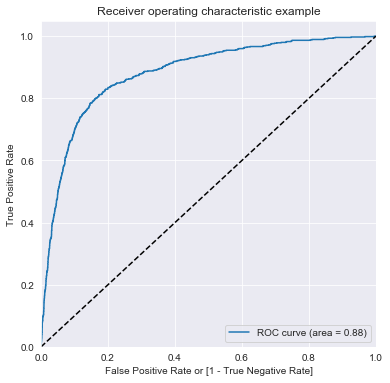

In [128]:
# Plotting ROC curve
fpr, tpr, thresholds = metrics.roc_curve(y_test, pred_probs_test, drop_intermediate = False )
auc_score = metrics.roc_auc_score(y_test, pred_probs_test)
plt.figure(figsize=(6, 6))
plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

# Step 3.2 Model Building to identify important predictor

As per the business objective we need to identify important predictor for churn. So we selected __Logistic Regression__ to identify those predictors.

## Logistic Regression

### 1. Handling Multicollinearity

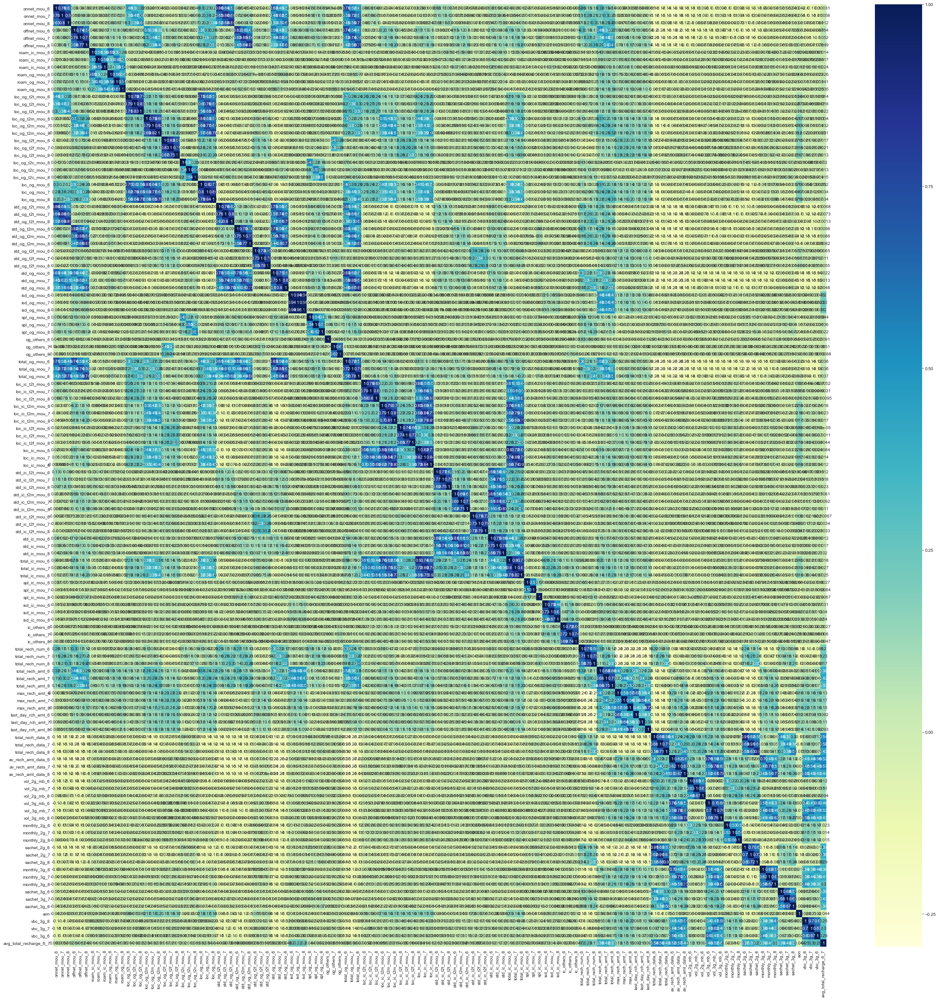

In [129]:
# plotting the correlation matrix between Principal Components and Original variables
%matplotlib inline
corr = X_train.corr() 
plt.figure(figsize = (40,40))
sns.heatmap(corr, cmap='YlGnBu', annot=True)
plt.show()

In [130]:
# Correlation matrix
cm = sns.light_palette("skyblue", as_cmap=True) 
corr.style.background_gradient(cmap=cm).set_precision(2)

In [131]:
# Selecting only columns having correlation more than 0.70
rows, cols = X_train.shape
col = list(X_train.columns)

corr = X_train.corr().values

for i in range(cols):
    for j in range(i+1, cols):
        if corr[i,j] > 0.7:
            print(col[i], ' ', col[j], ' ', corr[i,j])

onnet_mou_6   onnet_mou_7   0.7584759735089116
onnet_mou_6   std_og_t2t_mou_6   0.8566712134459801
onnet_mou_6   total_og_mou_6   0.7145936509175628
onnet_mou_7   onnet_mou_8   0.8030123345724174
onnet_mou_7   std_og_t2t_mou_7   0.855473733383133
onnet_mou_7   total_og_mou_7   0.717436786808565
onnet_mou_8   std_og_t2t_mou_8   0.854222233516643
onnet_mou_8   total_og_mou_8   0.729651588486254
offnet_mou_6   offnet_mou_7   0.7412582699389965
offnet_mou_6   std_og_t2m_mou_6   0.8218595876916214
offnet_mou_6   total_og_mou_6   0.7413355504772263
offnet_mou_7   offnet_mou_8   0.7722131049969112
offnet_mou_7   std_og_t2m_mou_7   0.8538947983318955
offnet_mou_7   total_og_mou_7   0.7439929952900594
offnet_mou_8   std_og_t2m_mou_8   0.8525707972246431
offnet_mou_8   total_og_mou_8   0.759752253458594
loc_og_t2t_mou_6   loc_og_t2t_mou_7   0.7901733153598731
loc_og_t2t_mou_6   loc_og_t2t_mou_8   0.7066759001941073
loc_og_t2t_mou_6   loc_og_mou_6   0.750092983774467
loc_og_t2t_mou_7   loc_og_t2t

In [132]:
X_train.drop(['onnet_mou_6','onnet_mou_7','onnet_mou_8','offnet_mou_6','offnet_mou_7',
                 'offnet_mou_8','roam_ic_mou_7','roam_og_mou_7','loc_og_t2t_mou_6','loc_og_t2t_mou_7','loc_og_t2t_mou_8',
                 'loc_og_t2m_mou_6','loc_og_t2m_mou_7','loc_og_t2m_mou_8','loc_og_t2f_mou_6','loc_og_mou_6','loc_og_mou_7',
                 'std_og_t2t_mou_6','std_og_t2t_mou_8','std_og_t2m_mou_6','std_og_t2m_mou_7','std_og_t2m_mou_8',
                 'std_og_t2f_mou_7','std_og_mou_6','std_og_mou_7','std_og_mou_8','isd_og_mou_6',
                 'isd_og_mou_7','og_others_7','loc_ic_t2t_mou_6','loc_ic_t2t_mou_7',
                 'loc_ic_t2m_mou_6','loc_ic_t2m_mou_7','loc_ic_t2m_mou_8','loc_ic_t2f_mou_6',
                 'loc_ic_t2f_mou_7','loc_ic_mou_6','loc_ic_mou_7','loc_ic_mou_8','std_ic_t2t_mou_6','std_ic_t2t_mou_7',
                 'std_ic_t2m_mou_6','std_ic_t2m_mou_7','std_ic_t2m_mou_8','std_ic_t2f_mou_6', 'std_ic_t2f_mou_7',
                 'std_ic_mou_6','total_ic_mou_6','total_ic_mou_7','isd_ic_mou_6','isd_ic_mou_7','ic_others_6','ic_others_7',
                 'total_rech_amt_6','total_rech_amt_7','max_rech_amt_8','total_rech_data_6','total_rech_data_7',
                 'loc_og_t2f_mou_7','total_og_mou_6','total_og_mou_7','std_ic_mou_7','total_rech_num_7','sachet_2g_7',
                 'total_rech_data_8','vol_3g_mb_6','vol_3g_mb_7','vol_3g_mb_8','monthly_3g_6','monthly_3g_7','monthly_3g_8',
                 'sachet_2g_6','sachet_3g_6','vbc_3g_7'],axis=1,inplace=True)

X_test.drop(['onnet_mou_6','onnet_mou_7','onnet_mou_8','offnet_mou_6','offnet_mou_7',
                 'offnet_mou_8','roam_ic_mou_7','roam_og_mou_7','loc_og_t2t_mou_6','loc_og_t2t_mou_7','loc_og_t2t_mou_8',
                 'loc_og_t2m_mou_6','loc_og_t2m_mou_7','loc_og_t2m_mou_8','loc_og_t2f_mou_6','loc_og_mou_6','loc_og_mou_7',
                 'std_og_t2t_mou_6','std_og_t2t_mou_8','std_og_t2m_mou_6','std_og_t2m_mou_7','std_og_t2m_mou_8',
                 'std_og_t2f_mou_7','std_og_mou_6','std_og_mou_7','std_og_mou_8','isd_og_mou_6',
                 'isd_og_mou_7','og_others_7','loc_ic_t2t_mou_6','loc_ic_t2t_mou_7',
                 'loc_ic_t2m_mou_6','loc_ic_t2m_mou_7','loc_ic_t2m_mou_8','loc_ic_t2f_mou_6',
                 'loc_ic_t2f_mou_7','loc_ic_mou_6','loc_ic_mou_7','loc_ic_mou_8','std_ic_t2t_mou_6','std_ic_t2t_mou_7',
                 'std_ic_t2m_mou_6','std_ic_t2m_mou_7','std_ic_t2m_mou_8','std_ic_t2f_mou_6', 'std_ic_t2f_mou_7',
                 'std_ic_mou_6','total_ic_mou_6','total_ic_mou_7','isd_ic_mou_6','isd_ic_mou_7','ic_others_6','ic_others_7',
                 'total_rech_amt_6','total_rech_amt_7','max_rech_amt_8','total_rech_data_6','total_rech_data_7',
                 'loc_og_t2f_mou_7','total_og_mou_6','total_og_mou_7','std_ic_mou_7','total_rech_num_7','sachet_2g_7',
                 'total_rech_data_8','vol_3g_mb_6','vol_3g_mb_7','vol_3g_mb_8','monthly_3g_6','monthly_3g_7','monthly_3g_8',
                 'sachet_2g_6','sachet_3g_6','vbc_3g_7'],axis=1,inplace=True)

In [133]:
# Selecting only columns having correlation more than 0.70
rows, cols = X_train.shape
col = list(X_train.columns)

corr = X_train.corr().values

for i in range(cols):
    for j in range(i+1, cols):
        if corr[i,j] > 0.7:
            print(col[i], ' ', col[j], ' ', corr[i,j])

Now, no multicollinearity exist among the features.

In [134]:
X_train.shape

(21000, 54)

### 2: Model Building

#### <span style="color:blue">Method used</span>
- <span style="color:green">__For feature selection__</span> - We will be using <span style="color:red">__RFE(Recursive Feature Elimination) method__</span>
- <span style="color:green">__For model assessment with detailed statistics__</span> - We will be using <span style="color:red">__statsmodels.api__</span>

__Assumption__
During model building we will remove variable if its <span style="color:blue">__p value > 0.05 & VIF > 2__</span>

#### Running first model

In [135]:
# Importing library for statsmodels
import statsmodels.api as sm

# Importing library for calculating metrics
from sklearn import metrics

In [136]:
# Running Logistic regression model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                21000
Model:                            GLM   Df Residuals:                    20945
Model Family:                Binomial   Df Model:                           54
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3960.4
Date:                Mon, 13 May 2019   Deviance:                       7920.9
Time:                        22:00:34   Pearson chi2:                 1.64e+11
No. Iterations:                     9   Covariance Type:             nonrobust
==========================================================================================
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     -4.2859      0.078    -55.208      0.000      -4.438      -4.134
roam_ic_mou_6              0.0847      0.031      2.698      0.007       0.023       0.146
roam_ic_mou_8              0.0102      0.025      0.408      0.683      -0.039       0.059
roam_og_mou_6              0.0231      0.030      0.782      0.434      -0.035       0.081
roam_og_mou_8              0.1003      0.029      3.501      0.000       0.044       0.156
loc_og_t2f_mou_8          -0.0048      0.072     -0.067      0.947      -0.145       0.135
loc_og_t2c_mou_6          -0.1003      0.039     -2.585      0.010      -0.176      -0.024
loc_og_t2c_mou_7          -0.0328      0.043     -0.761      0.447      -0.117       0.052
loc_og_t2c_mou_8           0.0604      0.053      1.140      0.254      -0.043       0.164
loc_og_mou_8              -0.6009      0.137     -4.393      0.000      -0.869      -0.333
std_og_t2t_mou_7           0.0854      0.034      2.545      0.011       0.020       0.151
std_og_t2f_mou_6           0.0929      0.043      2.138      0.032       0.008       0.178
std_og_t2f_mou_8          -0.2377      0.116     -2.045      0.041      -0.465      -0.010
isd_og_mou_8              -0.0545      0.087     -0.626      0.531      -0.225       0.116
spl_og_mou_6               0.0666      0.041      1.628      0.104      -0.014       0.147
spl_og_mou_7               0.1104      0.048      2.294      0.022       0.016       0.205
spl_og_mou_8              -0.1806      0.081     -2.235      0.025      -0.339      -0.022
og_others_6               -0.1885      0.073     -2.596      0.009      -0.331      -0.046
og_others_8                0.0299      0.041      0.735      0.462      -0.050       0.110
total_og_mou_8            -0.4995      0.078     -6.374      0.000      -0.653      -0.346
loc_ic_t2t_mou_8           0.0413      0.228      0.181      0.857      -0.406       0.489
loc_ic_t2f_mou_8          -0.1105      0.136     -0.815      0.415      -0.376       0.155
std_ic_t2t_mou_8          -0.0547      0.114     -0.482      0.630      -0.277       0.168
std_ic_t2f_mou_8          -0.2129      0.160     -1.333      0.182      -0.526       0.100
std_ic_mou_8               0.5044      0.144      3.512      0.000       0.223       0.786
total_ic_mou_8            -1.8344      0.234     -7.853      0.000      -2.292      -1.377
spl_ic_mou_6               0.0917      0.036      2.547      0.011       0.021       0.162
spl_ic_mou_7              -0.0824      0.041     -2.030      0.042      -0.162      -0.003
spl_ic_mou_8              -0.3726      0.063     -5.921      0.000      -0.496      -0.249
isd_ic_mou_8               0.3192      0.060      5.276      0.000       0.201       0.438
ic_others_8                0.1057      0.047      2.253      0.024       0.014       0.198
total_rech_num_6           0.2160      0.036      5.969      0.000  

### Feature selection using RFE

In [137]:
# Importing RFE and LogisticRegression
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

logreg = LogisticRegression(class_weight='balanced') # Handling class imbalance

In [138]:
rfe = RFE(logreg, 15)             # running RFE with 15 variables as output
rfe = rfe.fit(X_train, y_train)

In [139]:
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('roam_ic_mou_6', False, 19),
 ('roam_ic_mou_8', False, 34),
 ('roam_og_mou_6', False, 39),
 ('roam_og_mou_8', True, 1),
 ('loc_og_t2f_mou_8', False, 37),
 ('loc_og_t2c_mou_6', False, 27),
 ('loc_og_t2c_mou_7', False, 14),
 ('loc_og_t2c_mou_8', False, 13),
 ('loc_og_mou_8', True, 1),
 ('std_og_t2t_mou_7', False, 6),
 ('std_og_t2f_mou_6', False, 32),
 ('std_og_t2f_mou_8', False, 20),
 ('isd_og_mou_8', False, 16),
 ('spl_og_mou_6', False, 29),
 ('spl_og_mou_7', False, 11),
 ('spl_og_mou_8', False, 12),
 ('og_others_6', False, 10),
 ('og_others_8', False, 40),
 ('total_og_mou_8', True, 1),
 ('loc_ic_t2t_mou_8', False, 33),
 ('loc_ic_t2f_mou_8', False, 15),
 ('std_ic_t2t_mou_8', False, 25),
 ('std_ic_t2f_mou_8', False, 8),
 ('std_ic_mou_8', True, 1),
 ('total_ic_mou_8', True, 1),
 ('spl_ic_mou_6', False, 21),
 ('spl_ic_mou_7', False, 22),
 ('spl_ic_mou_8', False, 3),
 ('isd_ic_mou_8', True, 1),
 ('ic_others_8', False, 26),
 ('total_rech_num_6', False, 2),
 ('total_rech_num_8', True, 1),
 

In [140]:
# Selecting only those columns having ranking as 1
col = X_train.columns[rfe.support_]
col

Index(['roam_og_mou_8', 'loc_og_mou_8', 'total_og_mou_8', 'std_ic_mou_8',
       'total_ic_mou_8', 'isd_ic_mou_8', 'total_rech_num_8',
       'last_day_rch_amt_8', 'av_rech_amt_data_8', 'vol_2g_mb_8',
       'monthly_2g_8', 'sachet_2g_8', 'aon', 'vbc_3g_8',
       'avg_total_recharge_6_7'],
      dtype='object')

#### Assessing the model with StatsModels

In [141]:
X_train_sm = sm.add_constant(X_train[col]) # Adding constant

# Running Logistic regression model
logm2 = sm.GLM(y_train, X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                21000
Model:                            GLM   Df Residuals:                    20984
Model Family:                Binomial   Df Model:                           15
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4096.5
Date:                Mon, 13 May 2019   Deviance:                       8193.0
Time:                        22:00:49   Pearson chi2:                 6.42e+07
No. Iterations:                     8   Covariance Type:             nonrobust
==========================================================================================
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     -4.3001      0.078    -55.388      0.000      -4.452      -4.148
roam_og_mou_8              0.1498      0.020      7.390      0.000       0.110       0.190
loc_og_mou_8              -0.6110      0.131     -4.682      0.000      -0.867      -0.355
total_og_mou_8            -0.4887      0.065     -7.533      0.000      -0.616      -0.362
std_ic_mou_8               0.5158      0.114      4.514      0.000       0.292       0.740
total_ic_mou_8            -2.0385      0.172    -11.844      0.000      -2.376      -1.701
isd_ic_mou_8               0.3259      0.060      5.428      0.000       0.208       0.444
total_rech_num_8          -0.5675      0.061     -9.232      0.000      -0.688      -0.447
last_day_rch_amt_8        -0.4605      0.058     -7.895      0.000      -0.575      -0.346
av_rech_amt_data_8        -0.6282      0.073     -8.615      0.000      -0.771      -0.485
vol_2g_mb_8               -0.5290      0.103     -5.115      0.000      -0.732      -0.326
monthly_2g_8              -0.4309      0.073     -5.867      0.000      -0.575      -0.287
sachet_2g_8               -0.6382      0.083     -7.711      0.000      -0.800      -0.476
aon                       -0.2142      0.036     -5.870      0.000      -0.286      -0.143
vbc_3g_8                  -0.4186      0.079     -5.286      0.000      -0.574      -0.263
avg_total_recharge_6_7     0.2592      0.036      7.172      0.000       0.188       0.330
==========================================================================================
"""

#### Checking VIFs

In [142]:
# Importing library for VIF 
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [143]:
# Creating a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
8,av_rech_amt_data_8,1.89
2,total_og_mou_8,1.79
4,total_ic_mou_8,1.76
1,loc_og_mou_8,1.69
6,total_rech_num_8,1.53
13,vbc_3g_8,1.50
11,sachet_2g_8,1.44
3,std_ic_mou_8,1.39
14,avg_total_recharge_6_7,1.36
9,vol_2g_mb_8,1.24


__All the feature has p < 0.05 and VIF < 2__

In [144]:
# Getting the predicted values on the train set
y_train_pred = pd.DataFrame(res.predict(X_train_sm))
y_train_pred = y_train_pred.values.reshape(-1)

## Creating a dataframe with the actual Churn flag and the predicted probabilities
y_train_pred_final = pd.DataFrame({'Churn':y_train, 'Churn_Prob':y_train_pred})
y_train_pred_final['CustId'] = y_train.index
y_train_pred_final.head()

,Churn,Churn_Prob,CustId
39186,0,0.070402,39186
39833,0,0.007832,39833
38778,0,0.044993,38778
43026,0,0.000006,43026
12271,0,0.004558,12271


In [145]:
##### Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)

# Let's see the head
y_train_pred_final.head()

,Churn,Churn_Prob,CustId,predicted
39186,0,0.070402,39186,0
39833,0,0.007832,39833,0
38778,0,0.044993,38778,0
43026,0,0.000006,43026,0
12271,0,0.004558,12271,0


In [146]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted))

0.9222380952380952


In [147]:
# Let's check roc_auc_score
"{:2.2}".format(metrics.roc_auc_score(y_train_pred_final.Churn, y_train_pred_final.Churn_Prob))

'0.88'

### Finding Optimal Cutoff Point

In [148]:
#Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head(10)

,Churn,Churn_Prob,CustId,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
39186,0,0.070402,39186,0,1,0,0,0,0,0,0,0,0,0
39833,0,0.007832,39833,0,1,0,0,0,0,0,0,0,0,0
38778,0,0.044993,38778,0,1,0,0,0,0,0,0,0,0,0
43026,0,0.000006,43026,0,1,0,0,0,0,0,0,0,0,0
12271,0,0.004558,12271,0,1,0,0,0,0,0,0,0,0,0
33607,0,0.001849,33607,0,1,0,0,0,0,0,0,0,0,0
51913,0,0.000961,51913,0,1,0,0,0,0,0,0,0,0,0
16668,0,0.001537,16668,0,1,0,0,0,0,0,0,0,0,0
54924,0,0.023817,54924,0,1,0,0,0,0,0,0,0,0,0
33733,0,0.049674,33733,0,1,0,0,0,0,0,0,0,0,0


In [149]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci','precision','recall'])
from sklearn.metrics import confusion_matrix

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    
    precision = cm1[1,1]/(cm1[1,1]+cm1[0,1])
    recall = cm1[1,1]/(cm1[1,1]+cm1[1,0])
    
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci,precision, recall ]
print(cutoff_df)

     prob  accuracy     sensi     speci  precision    recall
0.0   0.0  0.080524  1.000000  0.000000   0.080524  1.000000
0.1   0.1  0.811286  0.800710  0.812212   0.271888  0.800710
0.2   0.2  0.893048  0.690124  0.910819   0.403946  0.690124
0.3   0.3  0.921524  0.595506  0.950075   0.510908  0.595506
0.4   0.4  0.932952  0.437611  0.976332   0.618212  0.437611
0.5   0.5  0.922238  0.066233  0.997203   0.674699  0.066233
0.6   0.6  0.919667  0.011236  0.999223   0.558824  0.011236
0.7   0.7  0.919524  0.004140  0.999689   0.538462  0.004140
0.8   0.8  0.919381  0.000000  0.999896   0.000000  0.000000
0.9   0.9  0.919429  0.000000  0.999948   0.000000  0.000000


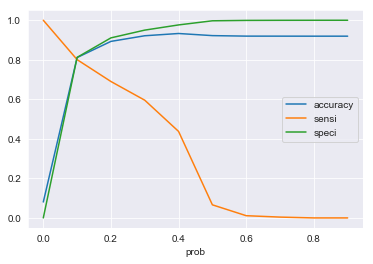

In [150]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

In [151]:
# Predicting final_predicted for leads
y_train_pred_final['final_predicted'] = y_train_pred_final.Churn_Prob.map( lambda x: 1 if x > 0.1 else 0)

y_train_pred_final.head()

,Churn,Churn_Prob,CustId,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
39186,0,0.070402,39186,0,1,0,0,0,0,0,0,0,0,0,0
39833,0,0.007832,39833,0,1,0,0,0,0,0,0,0,0,0,0
38778,0,0.044993,38778,0,1,0,0,0,0,0,0,0,0,0,0
43026,0,0.000006,43026,0,1,0,0,0,0,0,0,0,0,0,0
12271,0,0.004558,12271,0,1,0,0,0,0,0,0,0,0,0,0


### Model evaluation on train data

In [152]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.final_predicted)

0.8112857142857143

In [153]:
confusion4 = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final.final_predicted )
confusion4

array([[15683,  3626],
       [  337,  1354]], dtype=int64)

In [154]:
TP = confusion4[1,1] # true positive 
TN = confusion4[0,0] # true negatives
FP = confusion4[0,1] # false positives
FN = confusion4[1,0] # false negatives

In [155]:
# Let's see the sensitivity of our logistic regression model
print("Sensitivity",TP / float(TP+FN))
print("\n")

# Let us calculate specificity
print("Specificity",TN / float(TN+FP))

Sensitivity 0.8007096392667061


Specificity 0.8122119219017039


In [156]:
# roc_auc score
"{:2.2}".format(metrics.roc_auc_score(y_train_pred_final.Churn, y_train_pred_final.Churn_Prob))

'0.88'

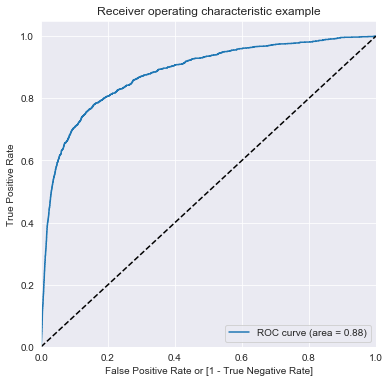

In [157]:
# Plotting ROC curve
fpr, tpr, thresholds = metrics.roc_curve(y_train_pred_final.Churn, y_train_pred_final.Churn_Prob,
                                         drop_intermediate = False )
auc_score = metrics.roc_auc_score(y_train_pred_final.Churn, y_train_pred_final.Churn_Prob)
plt.figure(figsize=(6, 6))
plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

### Model Evaluation on Test data

In [158]:
# Applying learning of train dataset to test dataset
X_test = X_test[col]

# Adding constant
X_test_sm = sm.add_constant(X_test)
X_test_sm.head()

,const,roam_og_mou_8,loc_og_mou_8,total_og_mou_8,std_ic_mou_8,total_ic_mou_8,isd_ic_mou_8,total_rech_num_8,last_day_rch_amt_8,av_rech_amt_data_8,vol_2g_mb_8,monthly_2g_8,sachet_2g_8,aon,vbc_3g_8,avg_total_recharge_6_7
20296,1.0,-0.192132,-0.576439,-0.734983,-0.286095,-0.630710,-0.159451,-0.643976,0.340926,-0.623153,-0.337356,-0.376513,-0.416085,-0.559188,-0.401980,-0.320980
8279,1.0,-0.142312,-0.632692,-0.771118,-0.198468,-0.702645,-0.159451,-0.320548,-0.624269,-0.241913,0.218667,-0.376513,0.369157,-0.491813,-0.401980,-0.216801
72269,1.0,-0.192132,1.560457,0.783297,0.022884,0.492325,-0.155911,-0.212739,0.247088,-0.623153,-0.337356,-0.376513,-0.416085,-1.020287,-0.401980,0.030056
65602,1.0,-0.192132,0.105302,-0.303021,-0.271409,-0.251648,-0.159451,1.404402,-0.423186,-0.623153,-0.337356,-0.376513,-0.416085,0.014553,-0.401980,-0.463282
42758,1.0,0.200035,-0.633833,-0.764189,-0.311674,-0.680787,-0.001104,-0.859595,-0.624269,-0.623153,-0.337356,-0.376513,-0.416085,0.385117,-0.357353,-0.134516


In [159]:
y_test_pred = res.predict(X_test_sm)

In [160]:
# Converting y_test_pred to a dataframe which is an array
y_pred_1 = pd.DataFrame(y_test_pred)

# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)

# Putting LeadID to index
y_test_df['CustId'] = y_test_df.index

# Removing index for both dataframes to append them side by side 
y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

# Appending y_test_df and y_pred_1
y_pred_final = pd.concat([y_test_df, y_pred_1],axis=1)

# Renaming the column 
y_pred_final= y_pred_final.rename(columns={ 0 : 'Churn_Prob'})
y_pred_final.head()

,Churn,CustId,Churn_Prob
0,1,20296,0.245956
1,1,8279,0.163791
2,0,72269,0.004925
3,0,65602,0.029787
4,1,42758,0.382840


In [161]:
y_pred_final['final_predicted'] = y_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.1 else 0)
y_pred_final.head()

,Churn,CustId,Churn_Prob,final_predicted
0,1,20296,0.245956,1
1,1,8279,0.163791,1
2,0,72269,0.004925,0
3,0,65602,0.029787,0
4,1,42758,0.382840,1


In [162]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_pred_final.Churn, y_pred_final.final_predicted)

0.8157982446394845

In [163]:
# Confusion matrix 
confusion4_1 = metrics.confusion_matrix(y_pred_final.Churn, y_pred_final.final_predicted)
confusion4_1

array([[6739, 1512],
       [ 146,  604]], dtype=int64)

In [164]:
TP1 = confusion4_1[1,1] # true positive 
TN1 = confusion4_1[0,0] # true negatives
FP1 = confusion4_1[0,1] # false positives
FN1 = confusion4_1[1,0] # false negatives

In [165]:
# Let's see the sensitivity of our logistic regression model
print("Sensitivity",TP1 / float(TP1+FN1))

# Let us calculate specificity
print("Specificity",TN1 / float(TN1+FP1))

Sensitivity 0.8053333333333333
Specificity 0.8167494849109199


In [166]:
# roc_auc_score
"{:2.2}".format(metrics.roc_auc_score(y_pred_final.Churn, y_pred_final.Churn_Prob))

'0.88'

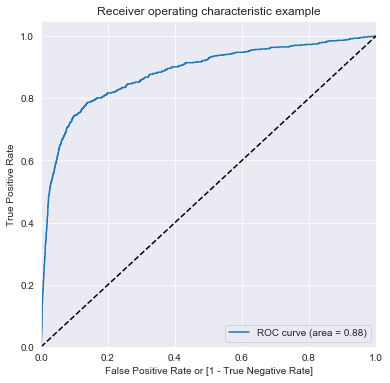

In [167]:
# Plotting ROC curve
fpr, tpr, thresholds = metrics.roc_curve(y_pred_final.Churn, y_pred_final.Churn_Prob,
                                         drop_intermediate = False )
auc_score = metrics.roc_auc_score(y_pred_final.Churn, y_pred_final.Churn_Prob)
plt.figure(figsize=(6, 6))
plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

# Step 4. Visualising important predictors for Churn

In [168]:
# Creating the dataframe from the important features obtained after performing Logistic Regression
imp_feature = pd.DataFrame(res.params)
imp_feature.reset_index(inplace=True)
imp_feature = imp_feature.rename(columns={ 0 : 'Coefficients', 'index':'Features'})
imp_feature = imp_feature.loc[imp_feature['Features'] != 'const']
imp_feature

,Features,Coefficients
1,roam_og_mou_8,0.149798
2,loc_og_mou_8,-0.610978
3,total_og_mou_8,-0.488709
4,std_ic_mou_8,0.515808
5,total_ic_mou_8,-2.038450
6,isd_ic_mou_8,0.325944
7,total_rech_num_8,-0.567520
8,last_day_rch_amt_8,-0.460500
9,av_rech_amt_data_8,-0.628173
10,vol_2g_mb_8,-0.529045


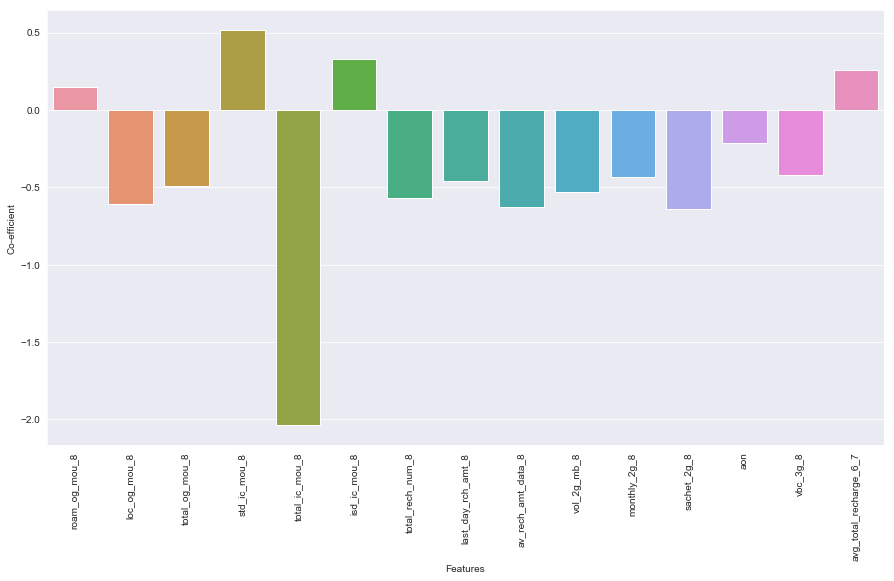

In [169]:
# Plotting important features against their coefficients
import matplotlib.pyplot as plt
plt.figure(figsize=(15,8))
plt.subplot(111)
ax1 = sns.barplot(x = imp_feature['Features'], y = imp_feature['Coefficients'])
ax1.set_xticklabels(ax1.get_xticklabels(),rotation=90, fontsize=10)
plt.ylabel('Co-efficient')
plt.show()

# Step 5. Conclusion

## Summary and Findings

- From the given dataset we identified the High-value churn customer and tagged the churners as per problem statement.


- As the number of features were too many we used PCA on the High-value churn customer dataframe to perform dimensionality reduction.


### For first business objective

#### For first business objective i.e. predicting whether a high-value customer will churn or not we trained variety of model. 
__The evaluation metric chosen were Sensitivity, Specificity, Accuracy, ROC_AUC_SCORE obtained as follows:__
   - __Logistic Regression__
        - ROC AUC
            - Train - 0.9 & Test -  0.89
        - Sensitivity 
            - Train - 0.83 & Test - 0.836
        - Specificity
            - Train - 0.817 & Test - 0.815
        - Accuracy
            - Train - 0.818 & Test - 0.816
            
   - __Decision Tree__
        - ROC AUC
            - Train - 0.90 & Test - 0.81
        - Sensitivity 
            - Train - 0.811 & Test - 0.702
        - Specificity
            - Train - 0.834 & Test - 0.828
        - Accuracy
            - Train - 0.832 & Test - 0.817
   
   - __Random Forest__
        - ROC AUC
            - Train - 0.9 & Test - 0.88
        - Sensitivity 
            - Train - 0.651 &  Test - 0.632
        - Specificity
            - Train - 0.92 & Test - 0.92
        - Accuracy
            - Train - 0.899 & Test - 0.896
            
##### With PCA and Logistic Regression (using class_weight parameter to handle class imbalance), we are getting best balance prediction with 
   - ROC AUC approx 90% for both train & test 
   - Churn Predicton Accuracy more than 81% for both train & test
   - with Sensitivity approx 83% and Specificity approx 81%

##### With PCA and Decision Tree 
   - Sensitivity is low for test data approx 70% as compared to 82% for train data
   - So there is no balance in train and test data sensitivity

##### With PCA and Random Forest 
   - Sensitivity is low for both train (65%) and test(63%)
   - So sensitivity is not upto the mark.
    
Since we are more concerned to identify churners than the non-churners accurately, __Logistic Regression is the best model__ among all three models that we applied.

### For second business objective
#### For second business objective i.e. identify important variables that are strong predictors of churn we performed 
   - __Logistic Regression__
       - ROC AUC
           - Train - 0.88
           - Test -  0.88
       - Sensitivity 
           - Train - 0.80
           - Test - 0.805
       - Specificity
           - Train - 0.812
           - Test - 0.816
       - Accuracy
           - Train - 0.811
           - Test - 0.815

- __Important features identified from LR are as follows:__
    - roam_og_mou_8 (Roaming outgoing minutes of usage in 8th month)
    - loc_og_mou_8 (Local outgoing minutes of usage in 8th Month)
    - total_og_mou_8 (Toal outgoing minutes of usage in 8th Month)
    - std_ic_mou_8 (STD incoming minutes of usage in 8th Month)
    - total_ic_mou_8 (Total incoming minutes of usage in 8th Month)
    - isd_ic_mou_8 (ISD incoming minutes of usage in 8th Month)
    - total_rech_num_8 (Total number of recharge in 8th Month)
    - last_day_rch_amt_8 (Last day of recharge amount in 8th month)
    - av_rech_amt_data_8 (Average amount of data recharge in 8th month)
    - vol_2g_mb_8 (Mobile internet usage volume of 2g in 8th month)
    - monthly_2g_8 (Monthly validty of 2g recharge for 8th month)
    - sachet_2g_8 (Less than month validity of 2g recharge for 8th month)
    - aon (Age on network - number of days the customer is using the operator T network)
    - vbc_3g_8 (Volume based cost usage of 3g data in 8th month)
    - avg_total_recharge_6_7 (Average total recharge of 6th and 7th Month)

## Recommendations

#### From the graph we can see that the below subscribers have a lower probability of churning i.e. subscribers 
 - with higher IC/OG Minutes of usage
 - with higher 2G (MB) volume, 
 - those who have used 3G, 
 - those who have recharged a number of times in the action phase (August month)
 - who have also recharged on the last day of the August month, 
 - those using monthly and sachet schemes, 
 - those who have been using the Services for a longer period (age on network is more)  

#### Recommendation
 - To discourage subscribers from Churning, we can offer them more lucrative monthly and sachet schemes. 
 - Provide them incoming free and outgoing calls at a cheaper rate 
 - Have cost effective schemes which provides both IC/OG with 2G/3G data. 